# Embeddings and Transformers
Goals of this lecture are:
* understand word embeddings
* fine-tune a BERT model for text classification 
* visualize BERT embeddings
* understand multimodal embeddings from CLIP 
* use CLIP for a image-to-text retrieval system
* implement a text-to-text retrieval system with the universal sentence encoder model

## Structure of this Notebook
In this lecture, we begin by analyzing and understanding a pre-trained word2vec model that was used in earlier modern NLP systems before transformer models were released. We still use word2vec here to get a basic understanding of how words can be represented in neural networks and why transformer models have an advantage over word2vec embeddings.

After analyzing the word2vec embeddings, we fine-tune a BERT model on the provided German news dataset and visualize the BERT embeddings to get a better understanding of the differences.

The next major step after transformers for language modeling was the CLIP model, which combines text with images. We analyze the CLIP embeddings for different datasets and get an idea of why CLIP can be used for zero-shot classification of image data without fine-tuning the model on new data. We then use the CLIP model to find for given images, suitable news messages.

In the last part of this lecture, we implement a text-to-text retrieval system by first understanding why CLIP is not well suited for text-to-text retrieval, and then using the universal sentence encoder model for retrieving text passages.

This notebook will show you how easily these models can be used with the [HuggingFace](https://huggingface.co/) and [SentenceTransformers](https://www.sbert.net/) libraries, which provide a high-level interface to the aforementioned models. This lecture is primarily about understanding the concept of embeddings rather than how to define your own architecture and train it.

First, however, we start by explaining the history and evolution of text representations for machine learning algorithms.

Reuqired libraries:
```
conda install numpy scipy
conda install scikit-learn
conda install numba
pip install umap-learn
pip install plotly
pip install 'transformers[torch]'
pip install sentence-transformers
pip install gensim
````


## Overall Picture and Evolution Path of Word Embeddings

The conventional way of modelling documents in tasks like information-retrieval, document-clustering, document-classification, sentiment-analysis, topic-classification is to represent each document as a **Bag-Of-Word**-vector $$\mathbf{d}_i=(tf_{i,0},tf_{i,1},\ldots tf_{i,|V|}).$$ Each component of this vector corresponds to a single term $j$ of the underlying vocabulary $V$ and the values $tf_{i,j}$ counts the frequency of term $j$ in document $i$. Instead of the term-frequency $tf_{i,j}$ it is also possible to fill the BoW-vector with 
* a binary indicator which indicates if the term $j$ appears in document $i$
* the tf-idf-values $$tfidf_{i,j}=tf_{i,j} \cdot log \frac{N}{df_j},$$ where $df_j$ is the frequency of documents, in which term $j$ appears, and $N$ is the total number of documents.

Independent of the values used, the BoW model represents sets of documents as 2-dimensional numeric arrays, which can easily be passed to conventional Machine Learning algorithms, such as Logistic Regression, SVM, MLPs etc. However, the major drawbacks of this approach are:
* the order by which terms appear in the document is totally ignored
* semantic relatedness of terms is not modelled
* BoW- vectors are very long and sparse 

As sketched in the picture below, today all of these drawbacks can be circumvented by representing the words of the document by their word-vectors and passing the corresponding sequence of word vectors in order to either a CNN or a Recurrent Neural Network such as LSTM or GRU. 

<img src="./Pics/overAllPicture.png" style="width:600px" align="middle">


---
## Course of Action

* Please write all executable python code in ```Code```-Cells (```Cell```->```Cell Type```->```Code```) and all Text as [Markdown](http://commonmark.org/help/) in ```Markdown```-Cells
* Describe your thinking and your decisions (where appropriate) in an extra Markdown Cell or via Python comments
* In general: discuss all your results and comment on them (are they good/bad/unexpected, could they be improved, how?, etc.). Furthermore, visualise your data (input and output).
* Write a short general conclusion at the end of the notebook
* Further experiments are encouraged. However, don't forget to comment on your reasoning.
* Use a scientific approach for all experiments (i.e. develop a hypothesis or concrete question, make observations, evaluate results)

## Submission

Upload your complete Notebook to the Ilias course until the start of the next lecture. One Notebook per group is sufficient. Edit the teammember table below.

**Important**: Also attach a HTML version of your notebook (```File```->```Download as```->```HTML```) in addition to the ```.ipynb```-File.

| Teammember |                    |
|------------|--------------------|
| 1.         | Nadine Weber    |
| 2.         | Patrick Singer      |
| 3.         | Milos Aleksic         |
---

## Part 1: Tasks on Word Embeddings

Word Embeddings for many languages can be downloaded for example from e.g. [FastText](https://fasttext.cc/docs/en/english-vectors.html). After downloading they can be imported into Python as described in [DSM.ipynb](DSM.ipynb). We use pretrained word2vec embeddings trained on [Common Crawl](https://commoncrawl.org/) and [Wikipedia](https://www.wikipedia.org/). Please download the binary model for the German language from: https://fasttext.cc/docs/en/crawl-vectors.html#models


In [1]:
from gensim.models.fasttext import load_facebook_model

model = load_facebook_model('./data/cc.de.300.bin.gz')

Please explain the meaning of `CBOW`, `dimension 300`, `n-grams of length 5`, `window of size 5` and `10 negatives` that were used for training of the provided word2vec models from this sentence:

"These models were trained using CBOW with position-weights, in dimension 300, with character n-grams of length 5, a window of size 5 and 10 negatives." (adapted from https://fasttext.cc/docs/en/crawl-vectors.html)



<font color="blue">
For better differentiation, all added comments from us will be marked in blue color.</font>

<h3><font color="blue"><b>Explanantion</b></font></h3>

Introducing the datatype text as words, sentences, sections or documents, a solution needed to be found how to map these words into programmable input data for machine learning algorithms. Before the concept of Word Embedding was invented, the words simply got mapped as a word-index, resulting in a huge vector (length depicted by the number of words in the vocabulary) with many zeros but in the position of the word-index itself. This was described as One-to-One Mapping or One-Hot-Encoding. Besides the length, the semantic correlation between words could thereby not be inspected.

Word Embeddings map words into a vector-space with smaller vectors. When they are semantically or syntactically close to each other, they will be grouped next to each other. Mathematically speaking, this means the euclidean distance is small. For generating Word Embeddings, two methods can be used: CBOW or Skipgram. They both apply the function of being well-structured.

The before mentioned sentence describes the training process of word2vec models using a set of specific parameters.

**CBOW** stands for Continuous Bag-of-Words, which is an architecture for creating word embeddings that uses n future words as well as n past words to create a word embedding. In CBOW, the distributed representations of context are used to predict the word in the middle of the window. A set of context words is used as input, and the target word is used as output in a feedforward neural network that is used for training.
<br><br>
**Dimension 300** refers to the size of the word embeddings generated by the model. Word embeddings are vector representations of words in a continuous vector space. In this case, each word is represented by a 300-dimensional vector.
<br><br>
An **n-gram** is a sequence of n items from a given sample of text or speech. In this case, character n-grams of length 5 are used, meaning the model considers sequences of 5 consecutive characters while training. This helps in capturing meaningful subword information and handling out-of-vocabulary words better.
<br><br>
The **window size** determines the number of context words considered around the target word. A window of size 5 means the model takes into account 5 words on both sides of the target word (5 words before and 5 words after) during training.
<br><br>
**10 negatives** refers to the number of negative samples used in the Negative Sampling technique employed during training. Negative Sampling is a method used to optimize the training process by selecting a small number of negative samples (words that are not in the context) for each positive sample (the actual context words). In this case, for every positive sample, 10 negative samples are randomly chosen to update the model's weights during training.

### Using Word Embeddings

#### Task 1: Meta information of the learned Word Embedding
For the word2vec-model display the following parameters:
* number of different words in the learned word2vec-model
* length of the word2vec-vectors
* context-length, applied in training the model

In [2]:
print(f" Number of different words in the model: {len(model.wv.key_to_index)}")

 Number of different words in the model: 2000000


In [3]:
print(f"Length of the word2vec vectors: {len(model.wv['hallo'])}")

Length of the word2vec vectors: 300


In [4]:
print(f"Context length: {model.window}")

Context length: 5


#### Task 2: Access Word Embeddings
Display the first 10 components of the vectors of words
* *hochschule*
* *universität*
* *anstalt*

What do you observe?

In [5]:
print([round(i, 4) for i in model.wv["hochschule"][:10]])
print([round(i, 4) for i in model.wv["universität"][:10]])
print([round(i, 4) for i in model.wv["anstalt"][:10]])

[0.0056, -0.0328, 0.0477, 0.0359, -0.0163, 0.0446, -0.0008, -0.0095, 0.0127, 0.031]
[0.0017, -0.0409, 0.0163, 0.0066, 0.0579, 0.0276, 0.0151, -0.0192, 0.0253, 0.0308]
[-0.0095, -0.0104, -0.0048, 0.0356, 0.0423, 0.0465, 0.0182, 0.0151, -0.0062, 0.1024]


<font color="blue"><b>Comment:</b></font> Before running the task, our prediction was that the words "hochschule" and "universität" would have similar embedding values while the word "anstalt" would differ more. <br> After looking at the result we observed that all 3 embeddings would differ significantly from each other. However the embeddings for "hochschule" and "universität" while still being different, were more similar to each other than both were to those of "anstalt".

Display the words (not the word-vectors) at indices 0 to 49 of the Word-embedding. What do you observe?

In [6]:
print(model.wv.index_to_key[:50])

[',', '.', '</s>', 'und', 'der', ':', 'die', '"', ')', '(', 'in', 'von', 'den', 'mit', 'ist', 'für', 'zu', '/', 'das', 'im', 'auf', 'des', 'ein', 'nicht', 'dem', 'Die', 'eine', 'sich', '-', 'auch', 'als', "'", 'es', 'an', 'Sie', 'bei', 'ich', 'aus', '–', '!', 'er', 'oder', 'wurde', '?', 'sind', 'nach', 'werden', 'am', 'zum', '&']


<font color="blue"><b>Comment:</b></font> We can observe that each index corresponds to one word or a symbol like "?" or ":". We can also see that the words and symbols are not in an alphabetical order. We suspect, that the words are ordered based on the number of appearances of each word because we can see mostly short and frequent words and symbols in this sample.

### Analyse Word Similarities

#### Task 3: Most similar words
For a German word of your choice, display the 20 most similar words.

In [7]:
print([x[0] for x in model.wv.most_similar('rewe', topn=20)])

['edeka', 'kaufland', 'lidl', 'rossmann', 'Kaufland', 'supermarkt', 'Rewe', 'schlecker', 'alnatura', 'marktkauf', 'aldi', 'mcdonalds', 'discounter', 'bäcker', 'rewe.de', 'Budni', '1euro', 'karstadt', 'REWE', 'Edeka']


<font color="blue"><b>Comment:</b></font> We tried to use an uncommon word to see, if the word2vec model could handle a specific word like "rewe". We expected that the most similar words would be something like "supermarkt" or "einkaufen", but in the model, other supermarket names like "edeka" and "kaufland" were most similar. This shows us that the model can also connect brand names with each other.

For a pair of German words of your choice, display their similarity-value.

In [8]:
print(model.wv.similarity('apfel', 'baum'))

0.49949497


In [9]:
print(model.wv.similarity('berg', 'strand'))

0.3612215


<font color="blue"><b>Comment:</b></font> In both examples we can see that the model can correctly label two objects that are connected with each other with a high similarity and things that dont share much in common with a low similarity.  

For two sets of German words of your choice, display their similarity-value.

In [10]:
model.wv.n_similarity(['Er', 'hat', 'einen', 'hund'], ['Ich', 'habe', 'eine', 'katze'])

0.5712589

#### Task 4: Word Relations
Apply the Word Embedding in order to answer the following questions:
* *Mann is to König as Frau is to ?*
* *Paris is to Frankreich as Berlin is to ?*
* *Student is to Hochschule as Arbeiter is to ?*

In [11]:
print(f"Mann is to König as Frau is to {model.wv.most_similar(positive=['Frau', 'König'], negative=['Mann'])[0][0]}")
print(f"Paris is to Frankreich as Berlin is to {model.wv.most_similar(positive=['Berlin', 'Frankreich'], negative=['Paris'])[0][0]}")
print(f"Student is to Hochschule as Arbeiter is to {model.wv.most_similar(positive=['Arbeiter', 'Hochschule'], negative=['Student'])[0][0]}")

Mann is to König as Frau is to Königin
Paris is to Frankreich as Berlin is to Deutschland
Student is to Hochschule as Arbeiter is to Arbeitern


#### Task 5: Outliers
Apply the Word Embedding in order to determine the outlier within the following set of words: *auto, motorrad, kran, essen*. 

In [12]:
print(f'The outlier is {model.wv.doesnt_match(["auto", "motorrad", "kran", "essen"])}')

The outlier is essen


### Visualize Word Embeddings
The following code-cell visualizes similarities of words from index 300 to 499 by transforming the high-dimensional word-vectors into a 2-dim space. The transformation is realized by [UMAP: Uniform Manifold Approximation and Projection for Dimension Reduction](https://umap-learn.readthedocs.io/en/latest/).

In [13]:
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
import umap

2023-04-25 17:09:15.711658: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


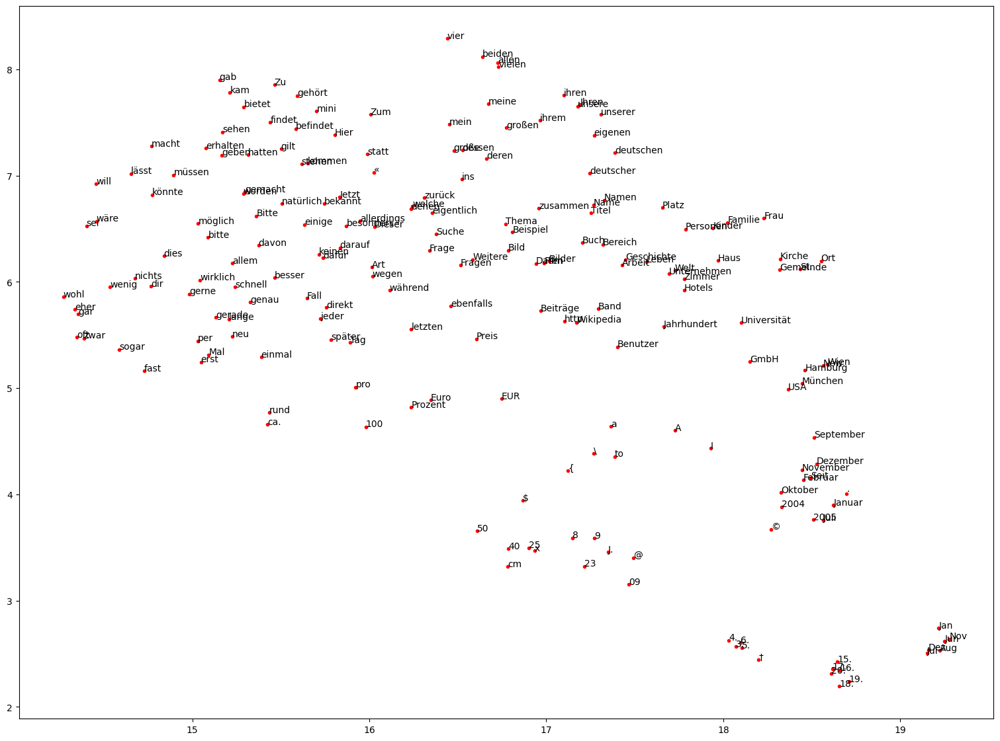

In [14]:
umap_model=umap.UMAP(n_components=2,random_state=0)
model2d=umap_model.fit_transform(model.wv[model.wv.index_to_key[300:500]])


plt.figure(figsize=(19,14))
idx=0
for a in model2d[:300]:
    #w=model.wv.index2word[300+idx].decode('utf-8')
    w=model.wv.index_to_key[300+idx]
    plt.plot(a[0],a[1],'r.')
    plt.text(a[0],a[1],w)
    idx+=1
plt.show()

<font color="blue"><b>Comment:</b></font> As UMAP converts the multi-dimensional space into a 2D-space, the correlations and distances between the words are nicely plotted.

#### Task 6: Visualize similarities of selected target words and their neighbors
For each of the word in the list `targetwords` calculate the 10 nearest neighbors. Then apply the same procedure as in the code cell above in order to visualize the similarities between all words in `wordset`, where `wordset` contains the target words and for each target word the 10 nearest neighbors. What do you observe? 

In [15]:
targetwords = ["Merkel", "Gras", "Putin", "reddit", "Atombombe", "Hochstapler", "Trump", "Wasser", "Meer", "Strand"]
wordset = []

for word in targetwords:
    wordset.append(word)
    wordset += [v[0] for v in model.wv.most_similar(word, topn=10)]

print(wordset)

['Merkel', 'Kanzlerin', 'Merkels', 'Bundeskanzlerin', 'Steinmeier', 'Schäuble', 'Gauck', 'Seehofer', '.Merkel', 'Westerwelle', 'Putin', 'Gras', 'gras', 'Grasbüschel', 'Büschen', 'Laub', 'Büsche', 'Wiesengras', 'Gebüsch', 'Gestrüpp', 'Rasen', 'Gräsern', 'Putin', 'Putins', 'Poroschenko', 'Kreml', 'Putin-Regierung', 'Kreml-Chef', 'Medwedew', 'Medwedjew', 'Lukaschenko', 'Putin-Russland', 'Poroshenko', 'reddit', 'reddit.com', 'Subreddit', 'Reddit', 'NeoGAF', 'Reddit.com', 'www.reddit.com', '4Chan', 'Reddit-Nutzer', '4chan', 'Subreddits', 'Atombombe', 'Atombomben', 'Atomwaffe', 'A-Bombe', 'Plutoniumbombe', 'Kernwaffe', 'Nuklearwaffe', 'Nuklearbombe', 'Atomwaffen', 'Wasserstoffbombe', 'Uranbombe', 'Hochstapler', 'Hochstaplern', 'Hochstaplers', 'Schwindler', 'Hochstaplerin', 'Betrüger', 'Buchstapler', 'Urkundenfälscher', 'Heiratsschwindler', 'Hochstapeleien', 'Lügner', 'Trump', 'Trumps', 'Obama', 'Clinton', 'Trump-', 'Anti-Trump', 'Trump-Regierung', 'Trump-Lager', 'Obamas', 'US-Präsident', 'Tr

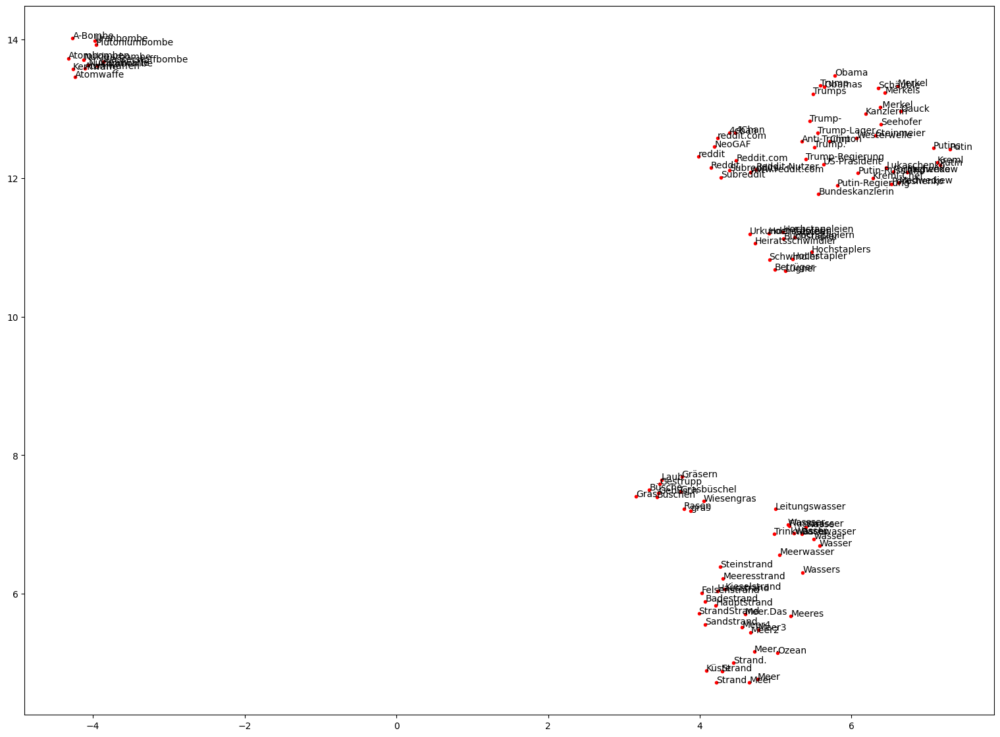

In [16]:
umap_model=umap.UMAP(n_components=2,random_state=0)
model2d=umap_model.fit_transform(model.wv[wordset])

plt.figure(figsize=(19,14))
idx=0
for a in model2d[:300]:
    plt.plot(a[0],a[1],'r.')
    plt.text(a[0],a[1], wordset[idx])
    idx+=1
plt.show()

<font color="blue"><b>Comment:</b></font> We can see that similar words are clustered together in the plot. In general, we can see three main clusters that seem to describe different types of things. One with nature objects like "Meer" or "Gras", another represents things that are related to human society like leader names or Websites, and the last cluster represents only the words similar to the keyword "Atombombe". <br> 
We didn't expect such a huge gap between Trump/Putin and "Atombombe" because we thought that both words would be used quite often together in news articles.

----

## Part 2: Using Transformers for Text Classification

In recent years Transformers have received increasing attention. Therefore we use the popular [Hugging Face Framework](https://huggingface.co/docs/transformers/model_doc/bert) to fine-tune a BERT model on our custom dataset.
The classifier shall be able to distinguish RSS-feed news with technical content from general RSS-feed news. Training and evaluation data is available from the folder `./Data/GERMAN/`.

Recap BERT Lecture: [MLBook](https://maucher.pages.mi.hdm-stuttgart.de/mlbook/transformer/attention.html#bert)

Hugging Face provides thousands of different pretrained models for NLP, Visison or other tasks. They also have a [blog](https://huggingface.co/blog) and a [NLP Course](https://huggingface.co/course/chapter1/1) with Transformers.

In this task we will use a the pretrained [Bert Model from deepset.ai](https://www.deepset.ai/german-bert) that was trained for hate speech detection on the GermEval18Coarse dataset and fine-tune it on our own classification task. Hugging Face provides a tutorial for a similar task in the [documentation](https://huggingface.co/transformers/v3.2.0/custom_datasets.html#sequence-classification-with-imdb-reviews). The model name used for loading the model from the library is: `deepset/bert-base-german-cased-hatespeech-GermEval18Coarse`

First we need to install the Transformers library:

In [17]:
# !pip install transformers[torch]

In [18]:
# check text classification models <here: https://huggingface.co/models?filter=text-classification
BERT_MODEL_NAME = "deepset/bert-base-german-cased-hatespeech-GermEval18Coarse"

We set the environment variable `WANDB_DISABLED` to true so that Hugging Face is not automatically trying to connect to a Weigths & Biases account. 

[Weights & Biases](https://wandb.ai/) is a machine learning platform for developers to build models faster. It provides tools to track experiments and datasets, evaluate model performance, reproduce models, visualize results etc.

In [19]:
import os
import sys
os.environ["WANDB_DISABLED"] = "true"

### Access locally stored RSS-feed news of both categories 
News crawled from RSS feeds of category `Tech` and `General` are stored in distinct directories. In the following code-cell the paths to both directories are configured. 

In [20]:
techpath="./Data/GERMAN/TECH/RSS/FeedText"
generalpath="./Data/GERMAN/GENERAL/RSS/FeedText"
catpaths=[techpath,generalpath]

The specified directory `techpath` must contain a list of directories. The name of each of these directories is the name of the feed, from which the news are crawled attached by the date of crawling. For example one subdirectory may be `golem-2017-11-07`. Each of this feed-and-date-specific subdirectories conatins one or more `.txt`-files. The name of each of these `.txt`-files is of format `hh-mm.txt`, i.e. it contains the daytime of crawling. If one feed is crawled multiple times per day, the feed-and-date-specific subdirectories will contain more than one `.txt`-files, each identified by the time of crawling. Below, the first lines of a sample `.txt`-file, `15-15.txt` from directory `golem-2017-11-07` are shown. Each paragraph of the file is a single news item from the *golem RSS feed*, crawled at 2017-11-07, 15.51h.

![Screenshot of feedfile](./Pics/feedfile.png)



In the following code-cell all news from all files are imported. All news from subdirectories of `techpath` are assigned to the class `Tech` (label 0) and all news from subdirectories of `generalpath` are assigned to class `GENERAL` (label 1). Each news-item is represented as a list of words, contained in the item. All item-specific word-lists are assigned to the list `texts` and the corresponding class-indices are assigned to the list `labels`. Before news-item specific word lists are appended to the `texts`-list it is checked, if they are not yet contained in this list.  

In [21]:
# second, prepare text samples and their labels
print('Processing text dataset')
texts = []  # list of text samples
labels_index = {}  # dictionary mapping label name to numeric id
labels = []  # list of label ids
for catlabel,categorypath in enumerate(catpaths):
    for name in sorted(os.listdir(categorypath)):
        feedpath = os.path.join(categorypath, name)
        if os.path.isdir(feedpath):
            for fname in sorted(os.listdir(feedpath)):
                fpath = os.path.join(feedpath, fname)
                if sys.version_info < (3,):
                    f = open(fpath)
                else:
                    f = open(fpath, encoding='utf-8')
                t = f.read()
                news=t.split('\n \n')
                for entry in news:
                    if (len(entry)>50) and (entry not in texts): #remove duplicates
                        #if entry not in texts:
                        texts.append(entry)
                        labels.append(catlabel)
                f.close()
print('Found %s texts.' % len(texts))

Processing text dataset
Found 3315 texts.


In [22]:
for i ,text in enumerate(texts[:3]):
    print(text, "\n" + "-"*20 if i != 2 else "")

Gestaltungstipps: T-Shirts bedrucken
Bedruckte T-Shirts sind ein All-Time-Favorite – egal, ob witzige Comic-Motive oder schlichte Formen. Tipps und Ideen rund um die Gestaltung. 
--------------------
Software-Charts: Die 50 Top-Downloads des Monats
CCleaner ist gehackt, die sichere neue Fassung laden Sie hier – samt Vollversionen: das Ashampoo Music Studio und PowerDirector. 
--------------------
Quereinsteiger-Jobs: So gelingt der Wechsel
Der Quereinstieg in eine neue Branche ist heute nicht mehr ungewöhnlich. Fragen und Tipps, die beim beruflichen Neustart helfen können. 


#### Task 0: Visualize distribution of document lengths
Visualize the distribution of the number of words in all documents in a histogram.

<font color="blue"><b>Comment:</b></font> To split the article text into words we first removed all "-" symbols as those would count as a separate word when written with spaces around, which is a common occurrence when looking at the examples above. Then we split the text at every space to get a list of every word.

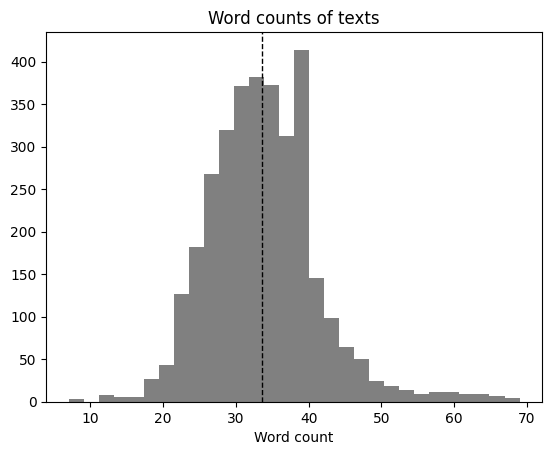

Maximum word count: 69
Minimum word count: 7
Mean word count: 34


In [23]:
from matplotlib import pyplot as plt
import numpy as np

# Show histogram plot
lengths = [len(text.replace("-", "").split(" ")) for text in texts]
plt.hist(lengths, bins=30, color="grey")
plt.axvline(np.mean(lengths), color='k', linestyle='dashed', linewidth=1)
plt.title("Word counts of texts")
plt.xlabel("Word count")
plt.show()

# Print statistics
print("Maximum word count:", max(lengths))
print("Minimum word count:", min(lengths))
print("Mean word count:", round(np.mean(lengths)))

<font color="blue"><b>Comment:</b></font> We can see in the plot, that most articles have a word count of between 20 and 50. The mean amount of words sits at around 34 and the maximum is 69 words. <br>
Based on this information, we assume that the amount of tokens needed for one article will be slightly larger as we know one word is often represented with more than one token.

#### Task 1: Load the Data into a custom Dataset  

#### Convert texts to sequence of integers

Apply the [BertTokenizer](https://huggingface.co/docs/transformers/v4.16.2/en/model_doc/bert#transformers.BertTokenizer) in order to uniquely map each word to an integer-index and to represent each text (news-item) as a sequence of integers. For more information, see the [Tokenizer-chapter](https://huggingface.co/course/chapter2/4?fw=pt) in the NLP course. Afterwards we load the custom texts into a custom Dataset. Also define the `max_length` of the sequences and use padding and truncation. We first need to split the dataset into a train and test split and then apply the tokenizer on the splits. 

#### Convert news article texts to token lists

In [24]:
from transformers import BertTokenizer

# Initialize the BERT tokenizer
tokenizer = BertTokenizer.from_pretrained(BERT_MODEL_NAME)
# Map each word(part) to a unique integer token 
tokenized_texts = [tokenizer.encode(text, add_special_tokens=True) for text in texts]

In [25]:
# Checking the created tokens
for i, token in enumerate(tokenized_texts[0][:10]):
    print(token, "=", tokenizer.decode([token]))

3 = [CLS]
13864 = Gestaltungs
15099 = ##ti
327 = ##pp
26902 = ##s
5982 = :
89 = T
243 = -
3475 = Sh
9614 = ##irt


<font color="blue"><b>Comment:</b></font> To check if the tokens were created correctly, we printed out the first few tokens and their corrensponding text. We can see, that most words were split in multiple tokens. We can also see that the first token is the [CLS] token marking the beginning of the sentence. We expected this token to appear because we used `add_special_tokens=True` in our encoding call.

#### Determine embedding length

In [26]:
# Check the max token length of the data
print("Max tokens per entry:", max([len(entry) for entry in tokenized_texts]))
embedding_length = 150

Max tokens per entry: 133


<font color="blue"><b>Comment:</b></font> Based on the max token amout of 133, we decided to set the embedding length of our model to 150. This was added to have a small padding in case slightly longer articles are given in the interference phase with important keywords at the end of the sentence. We decided to not expand the limit further to limit the increased training and inference time of our model. <br>
At first we set the embedding length of our model to the max token length of BERT which is 512. However we observed, that the model took a long time to encode sentences. After reducing the number to 150, the model was significantly faster.

#### Creating custom PyTorch Dataset

Then a custom Dataset can be created for training of the model. We will use a PyTorch Dataset here, as this model was trained with PyTorch and also to show that using the library with PyTorch is quite simple even though we have not used PyTorch in this course. In addition more PyTorch models are hosted on hugging face than Tensorflow models.

In [27]:
from torch.utils.data import Dataset

class CustomDataset(Dataset):
    def __init__(self, texts, labels, tokenizer):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer

    def __len__(self):
        return len(self.texts)

    # Returns pytorch tensors for tokenized text and label and mask
    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=embedding_length,
            padding="max_length",
            truncation=True,
            return_tensors="pt",
        )
        return {
            "input_ids": encoding["input_ids"].flatten(), # IDs = Tokens
            "attention_mask": encoding["attention_mask"].flatten(), # Mask shows if a token is padding
            "label": label,
        }

#### Task 2: Define the Bert Model
Next we can create a [Bert Model for Sequence Classification](https://huggingface.co/docs/transformers/model_doc/bert#transformers.BertForSequenceClassification) with the pretrained weights from the previously definded `BERT_MODEL_NAME`. We can use GPU support for training the model by calling `model = model.to('cuda')` after loading the model. This is, however, not necessary as the dataset is quite small and we also do not need to train the model for many epochs. 

For training the Bert-Model on a custom task we also need to set the custom number of the labels and also the flag `ignore_mismatched_sizes` to true. The parameters which can be set are listed in the [PretrainedConfig](https://huggingface.co/docs/transformers/v4.16.2/en/main_classes/configuration#transformers.PretrainedConfig).

In [28]:
import torch
from transformers import BertForSequenceClassification, BertConfig, TrainingArguments, Trainer

In [29]:
# Create a BertConfig object with custom parameters
config = BertConfig.from_pretrained(BERT_MODEL_NAME,
                                    num_labels=2, # number of classes: Tech and General
                                    ignore_mismatched_sizes=True)

# Create a Bert Model for Sequence Classification
model = BertForSequenceClassification.from_pretrained(BERT_MODEL_NAME, config=config)

# Determine if CPU or GPU is used
if torch.cuda.is_available():
    device = torch.device("cuda")
    print('Using GPU for training')
else:
    device = torch.device("cpu")
    print('No GPU available, using the CPU instead.')

Using GPU for training


<font color="blue"><b>Comment:</b></font> First we create a BertConfig instance where we define that we have 2 classes (tech and general) and set `ignore_mismatched_sizes` to True. This allows us to load a pre-trained model with a different number of labels than the original model. <br>
Then we check which device is available. In our case, training on the CPU took about 40 minutes while the GPU only took 10 minutes. 

#### Task 3: Define Training Arguments and train the Model
Hyperparameters for training a Hugging face Transformer Model are defined in a [TrainingArguments](https://huggingface.co/docs/transformers/v4.16.2/en/main_classes/trainer#transformers.TrainingArguments)-Object. We can mostly use the default arguments, but choose an appropriate batch size. Two epochs is already enough for finetuning of the model.

Additonally, we set the `evaluation_strategy`and `save_strategy` to `epoch` to make the model predicitons comparable with the CNN and LSTM-architecture. You also need to define a suitable value for `logging_steps`. This value should be smaller than the steps needed to complete an epoch as otherwise no values will be logged in the first epochs.

In [30]:
from sklearn.model_selection import train_test_split

new_training = True # Determines if new training is performend and saved model gets overwritten. 

In [31]:
# Creating a TrainingArguments instance
training_args = TrainingArguments(evaluation_strategy="epoch", 
                                  save_strategy="epoch",
                                  logging_steps=100,
                                  output_dir="./results",
                                  num_train_epochs=2)

Using the `WANDB_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to flag to control the integrations used for logging result (for instance --report_to none).


<font color="blue"><b>Comment:</b></font> In our testing, we found that the standard batch size of 8 of the TrainingArguments class fits for our task, which is why we didn't specify a custom batch size.

#### Train-Test split
We used a Train-Test split of 80-20

In [32]:
# Split the dataset into train and test splits
train_texts, test_texts, train_labels, test_labels = train_test_split(texts, labels, test_size=0.2, random_state=42)

# Apply the tokenizer on the splits with padding and truncation
train_dataset = CustomDataset(train_texts, train_labels, tokenizer)
test_dataset = CustomDataset(test_texts, test_labels, tokenizer)

Now we instantiate a [Trainer](https://huggingface.co/transformers/v3.2.0/main_classes/trainer.html#transformers.Trainer) with the defined model, training arguments and both datasets: 

In [33]:
# Instantiate the Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
)

Finally we can train the model:

In [34]:
if new_training:
    trainer.train()

/opt/miniconda3/envs/python3/lib/python3.9/site-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Epoch,Training Loss,Validation Loss
1,0.213700,0.202702
2,0.048700,0.228884


<font color="blue"><b>Comment:</b></font> In the fine tuning the training loss decreased significantly while the validation loss remained about the same. This could be a sign of overfitting. If we were to apply this model in a broader sense, it would probably be a good idea to increase the amount of training data and introduce concepts such as dropout or weight decay.

#### Task 4: Add an Evaluation Metric while Training the Model
As you should have already noticed, by default Hugging Face returns only loss and no other metrics. To get metrics for our training epochs, we should set the `compute_metrics` parameter of the Trainer. Define a function with the approriate metrics so that you can compare your metrics to the previous models. An example of a compute metrics function can be found [here](https://huggingface.co/transformers/v3.0.2/training.html#trainer).

Then retrain your model and interpret the training results.

In [35]:
from sklearn.metrics import precision_recall_fscore_support, accuracy_score

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='binary')
    acc = accuracy_score(labels, preds)
    return {
        'accuracy': acc,
        'f1': f1,
        'precision': precision,
        'recall': recall
    }

In [36]:
# Instantiate the Trainer
trainer_adv_metrics = Trainer(
                      model=model,
                      args=training_args,
                      train_dataset=train_dataset,
                      eval_dataset=test_dataset,
                      compute_metrics=compute_metrics
                      )

<font color="blue"><b>Comment:</b></font> To display more metrics, we use sklearn to calculate accuracy, f1 score, precision, and recall in the function `compute_metrics`. This function will be used in a new Trainer instance and the model will be trained again.

In [37]:
if new_training:
    trainer_adv_metrics.train()
    trainer_adv_metrics.save_model("./trained_models")

/opt/miniconda3/envs/python3/lib/python3.9/site-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
1,0.117500,0.299222,0.938160,0.953356,0.961009,0.945824
2,0.003200,0.455813,0.936652,0.952273,0.958810,0.945824


<font color="blue"><b>Comment:</b></font> With more evaluation metrics, the results look similar to before. The training loss decreased significantly while the validation loss actually increased this time. To combat this behavior, which looks like overfitting, one could employ the techniques described in the training results above.<br>
After training, the model is saved locally to avoid having to retrain the model every time when running the notebook

# Part 3: Visualize BERT embeddings

#### Task 1: Bert for Inference and compare example Sentences
After the model is trained, we can visualize the embeddings for the dataset and use the model for inference. For getting the hidden states of the model prediciton, you have to pass `output_hidden_states=True` to the forward/call method of the model. Additionally, you can pass `return_dict=True` to get a [BaseModelOutput](https://huggingface.co/docs/transformers/v4.27.2/en/main_classes/output#transformers.modeling_outputs.BaseModelOutput)-object, where you can then access the `last_hidden_state`-attribute.  

To understand the difference of the embeddings, you can use two example sentences where one word in the middle differs and compare the embeddings of both sentences. 
For comparing the two example sentences use `torch.isclose(first_sentence, second_sentence, atol=1e-05)` [Doc](https://pytorch.org/docs/stable/generated/torch.isclose.html). The `atol` parameter controls which numerical precision satsifies the `isclose` condition.

What can you observe in contrast to the word2vec embeddings? What is the main difference? 

In [38]:
import torch
from transformers import AutoTokenizer, BertForSequenceClassification 

In [39]:
tokenizer = AutoTokenizer.from_pretrained(BERT_MODEL_NAME)
model = BertForSequenceClassification.from_pretrained("./trained_models")

input_1 = tokenizer.encode("The car is blue", return_tensors="pt")
output_1 = model(input_1, output_hidden_states=True, return_dict=True)

input_2 = tokenizer.encode("The house is blue", return_tensors="pt")
output_2 = model(input_2, output_hidden_states=True, return_dict=True)

# Checking if both sentences have the same amount of tokens:
print(f"Tokens first sentence: {output_1.hidden_states[-1].size()[1]} | Tokens second sentence: {output_2.hidden_states[-1].size()[1]}")

print("\nComparison of first 6 embeddings of first token:")
print("Sentence 1:", output_1.hidden_states[-1][0][0][:6].detach().numpy())
print("Sentence 2:", output_2.hidden_states[-1][0][0][:6].detach().numpy())

Tokens first sentence: 8 | Tokens second sentence: 8

Comparison of first 6 embeddings of first token:
Sentence 1: [-0.00281223  1.0310621  -0.05655491  0.3860287   0.8075331   1.091657  ]
Sentence 2: [-0.1083606   0.7982577  -0.24598433  0.47087857  0.8690215   0.49793202]


<font color="blue"><b>Comment:</b></font> When comparing 2 sentences where only one word in the middle was changed, we can see, that the embeddings even on the first word which is identical in both are different. We assume that this is because in our case the first word "The" is referencing different objects in both sentences. Because of this the embeddings for the word "the" is different in the two sentences. 

In [40]:
# Testing torch.isclose with atol 1e-05
is_close_tensor = torch.isclose(output_1.hidden_states[-1], output_2.hidden_states[-1], atol=1e-05)
print("Comparison with atol = 1e-05:\n" + "-"*29 , "\n", is_close_tensor)
print(f"TRUE: {torch.count_nonzero(is_close_tensor)} | FALSE: {torch.numel(is_close_tensor) - torch.count_nonzero(is_close_tensor)}")

# Testing torch.isclose with atol 1e-01
is_close_tensor = torch.isclose(output_1.hidden_states[-1], output_2.hidden_states[-1], atol=1e-01)
print("\nComparison with atol = 1e-01:\n" + "-"*29 , "\n", is_close_tensor)
print(f"TRUE: {torch.count_nonzero(is_close_tensor)} | FALSE: {torch.numel(is_close_tensor) - torch.count_nonzero(is_close_tensor)}")

Comparison with atol = 1e-05:
----------------------------- 
 tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]]])
TRUE: 0 | FALSE: 6144

Comparison with atol = 1e-01:
----------------------------- 
 tensor([[[False, False, False,  ..., False, False, False],
         [ True, False, False,  ..., False, False, False],
         [False,  True, False,  ..., False, False, False],
         ...,
         [ True,  True, False,  ..., False, False, False],
         [False,  True, False,  ..., False,  True, False],
         [False, False, False,  ..., False, False,  True]]])
TRUE: 1408 | FALSE: 4736


<font color="blue"><b>Comment:</b></font> When comparing the 2 sentence embeddings with torch.isclose, we can see that with an atol value of 1e-05 not a single embedding value is close to its equivalent in the other sentence. When increasing the threshhold (atol = 1e-01), more embedding pairs return as close with torch.isclose. This shows that despite the 2 sentences having mostly the same words, the meaning of the sentence changes. The different embedding values show, that the model recognises this difference. <br> <br>
**Comparison to word2vec:** One difference to the word2vec embeddings is the length of the vectors. The word2vec embeddings have a length of 300, while we can customize the length of the BERT embeddings up to 512. Another difference is that the word2vec embeddings are pre-trained and do not need to be calculated by a model by the user. This means that the context of the words is not taken into account in the embedding, meaning the word2vec embeddings have exatly one embedding per word. The BERT embeddings on the other hand get created by the BERT model with training data so the same words can have different embeddings based on their position in the text. Both embedding types seem to have their applications, however we think that the BERT embeddings will perform better as they have a better understanding of context. 

#### Task 2: Create Embeddings for whole Dataset

Now we can create the embeddings for the entire dataset. Store the embeddings in a list so that we can visualize the embedding space. We need to use a dimensional reduction method like UMAP, which was used previously to visualize the word2vec embeddings. Average the embeddings over the first dimension so that we get a 2-dimensional tensor with `(number of texts, size of bert embedding)`.

For visualization, we can use a [Plotly scatter plot](https://plotly.com/python/line-and-scatter/). To analyze which sentences are close to each other in the embedding space, set the news text as hover data. Display only the first 100 characters of the news article, otherwise the hover box will be to large.

In [41]:
import umap
import numpy as np
from tqdm import tqdm
import plotly.express as px
reducer = umap.UMAP()

In [42]:
texts_embeddings = torch.empty(0, 768)
batch_size=5
for i in tqdm(range(int(len(texts)/batch_size))):
    try:
        tokenized_batch = tokenizer(texts[i*batch_size:(i+1)*batch_size], return_tensors="pt", max_length=embedding_length, padding="max_length")
        with torch.no_grad():
            batch_embeddings = model(**tokenized_batch, output_hidden_states=True, return_dict=True).hidden_states[-1]
        batch_embeddings = batch_embeddings.mean(axis=1)
        texts_embeddings = torch.cat((texts_embeddings, batch_embeddings), dim=0)
    except IndexError:
        break

100%|██████████| 663/663 [09:21<00:00,  1.18it/s]


<font color="blue"><b>Comment:</b></font> To create embeddings for every text in the dataset, we tokenize and embed in batches to speed up the process. We discovered, that when working on a GPU a small batch size like 5 should be selected. On the CPU we could select larger batch sizes up to 100. We assume, that this is because of the larger RAM size available to the CPU in comparison to the vRAM size of the GPU. At first we thought, that the GPU would be faster at encoding the dataset, but we discovered that the CPU is slightly faster. 

In [43]:
import pandas as pd

umap_model=umap.UMAP(n_components=2,random_state=0)
model2d=umap_model.fit_transform(texts_embeddings)

# create a dataframe from model2d and texts
df = pd.DataFrame(model2d, columns=["x", "y"])
df["text"] = texts
df["color"] = ['blue' if i == 0 else "red" for i in labels]

# plot with plotly express
fig = px.scatter(df, x="x", y="y", hover_data=["text"], hover_name="text", color="color")
fig.show()

<font color="blue"><b>Comment:</b></font> In the plot we can see 2 different regions of points. One point represents one news article while the color represents the type (tech or general). The separation of both news types into different regions shows, that the BERT model was able to successfully learn to differentiate between different types of news.

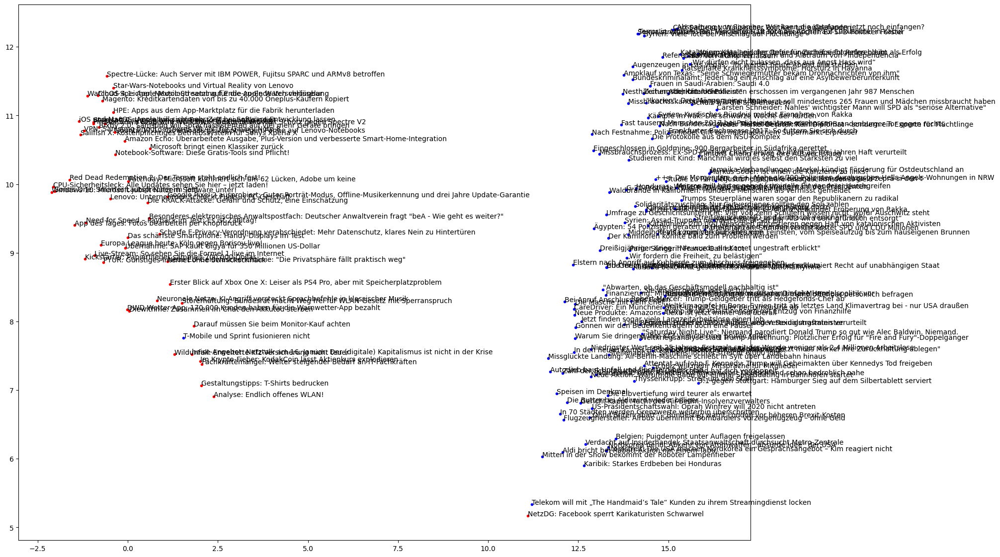

In [44]:
umap_model=umap.UMAP(n_components=2,random_state=0)
model2d=umap_model.fit_transform(texts_embeddings)

plt.figure(figsize=(19,14))
idx=0
plot_ever_x_entry = 20
for a in model2d[::plot_ever_x_entry]:
    plt.plot(a[0],a[1],'r.' if labels[idx*plot_ever_x_entry] == 0 else "b.")
    plt.text(a[0],a[1], texts[idx*plot_ever_x_entry][:texts[idx*plot_ever_x_entry].find("\n")])
    idx+=1
plt.show()

<font color="blue"><b>Comment:</b></font> We decided to recreate the plot again using matplotlib to see, if it would look presentable but we found out that for such a task interactive plots like with plotly are necessary if you also want to display the article text.

# Part 4: Visualize CLIP embeddings

This part was inpsired by: https://medium.com/mlearning-ai/having-fun-with-clip-features-part-i-29dff92bbbcd

After covering the differences of the transformer and word2vec embeddings, we will analyze the multimodal embeddings generated from the [OpenAI CLIP](https://openai.com/research/clip). Unlike GPT-4 the CLIP model was still released open source with pretrainend weights. We will use the pretrained weights, so we do not need to finetune the model. 

The main goal of this chapter is to understand why CLIP can be used for zero-shot classification on image datasets. Therefore, we analyze two different datasets, [CIFAR-10](https://www.cs.toronto.edu/~kriz/cifar.html) and the good old [MNIST](https://paperswithcode.com/dataset/mnist) dataset. 


## CLIP Overview
CLIP, Contrastive Language-Image Pre-training, was trained on over 400M image and text pairs collected from publicly available resources on the internet. A text-image pair consists of the image and a caption. You can think of the caption as the description of the image, such as when someone uploads a picture to Instagram and briefly describes what she/he is doing. 

<img src="Pics/clip-training.svg" width=500 />
The figure above shows an overview of the training objective. During training, CLIP is incentivized to match each image in the current batch to the correct caption. Then the loss for both encoders is calculated and backpropagated. This pushes the representation ob both encoders onto a common latent space. All other examples in the current batch are negative examples, as the caption doesn't fit to the image. This is called contrastive learning. The goal of contrastive learning is to learn representations in which the embeddings of similar instances are close to each other, while different instances are further away. 

For using CLIP in a zero-shot way to classify datasets, we generate text prompts for all classes in the style of `a photo of a {class_name}`. Then embeddings are created for all images and text prompts. To classify which image belongs to which class, the cosine similarity between the text prompts and image embeddings is calculated and the text prompt with the highest similarity is selected. See also the following image:
<img src="Pics/clip-overview.svg" width=500 />
(both pictures from https://openai.com/research/clip)

## Projection onto the same embedding space
We will use UMAP again for dimensional reduction. Unlike the visualization of the BERT and word2vec embeddings, CLIP consists of two different encoders, one for the image and one for the text. UMAP is able to map the embedding spaces of both encoders onto the same embedding space by first fitting and transforming the embedding space of the image dataset, and then using the fitted UMAP model to map the text embedding space onto the image embedding space. 

We will provide a function for plotting the text prompts into the embedding space, as this is a bit more complicated, to get matching colors for the text prompts and the labels of the images. It is also necessary to sort the image embeddings by the labels, before plotting the data. This ensures, that we can match the colors of the text prompts and the images. 

From now on we will also use the [SentenceTransformers](https://www.sbert.net/) library, which is another abstraction of the HuggingFace library and thus also easier to use. For further information on how to use CLIP with the SentenceTransformer library, see the [docs](https://www.sbert.net/examples/applications/image-search/README.html).

The CLIP model can be loaded with the name `clip-ViT-B-32`.


In [45]:
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

In [46]:
import pandas as pd
import plotly.express as px
import umap
import os
from matplotlib import pyplot as plt
import random
from datasets import load_dataset, get_dataset_config_names, get_dataset_infos, get_dataset_split_names
from sentence_transformers import SentenceTransformer
from sklearn.preprocessing import StandardScaler
%matplotlib inline
import numpy as np

#Load CLIP model
model = SentenceTransformer('clip-ViT-B-32', device='cpu')

#### Plot Prompt Embeddings
This function plots the low dimensional text prompts embeddings 
onto the same figure with a x marker to distinguish them from the image embeddings

Parameters:
* low_dim_text_embeddings: the 2-dimensional text prompt embeddings after the UMAP transform
* figure: the plotly figure, returned by the px.scatter function
* classes: the sorted classes of the dataset

In [47]:
def plot_text_prompt_embeddings(low_dim_text_embeddings, figure, classes):
    l, c = len(px.colors.qualitative.Plotly), len(low_dim_text_embeddings)
    df, colors = pd.DataFrame(low_dim_text_embeddings), (px.colors.qualitative.Plotly * ((c // l) + 1))[:c]
    figure.add_scatter(x=df[0], y=df[1], hovertext=classes, mode='markers', marker={'symbol':
                   'x', 'size':20, 'color': colors, 'opacity':0.8, 'line': dict(width=2, color="DarkSlateGrey")})

#### Load Embeddings
This function should load a dataset with a given name from the HuggingFace datasets
and create the embeddings for the images and class labels.
You need to create the automatic text prompts in the style of "a photo of a {class_name}" for each class.

It is also sufficient to plot a large enough subset of the data. 
n=1280 is already good enough to see, how the embedding space is clustered.
It could be that the keys in which the images are stored are not always the same.

Parameters:<br>
* name: the name of the dataset, e.g. 'cifar10' or 'mnist'<br>
* n: the number of images for which embeddings should be created.
    
Return: image embeddings, text embeddings, labels <br> <br>
<font color="blue"><b>Comment:</b></font> In addition to the requirements, we added an optional attribute for specifying the location of the saved embeddings and expanded the function to be able to save multiple embeddings of different datasets. <br>
In our testing, we discovered that the model did not perform well with the mnist dataset. Because of this we added the attributes `force_3channel` and `custom_text_prompts` in order to be able to test if the embeddings would work better with more image channels or other custom text prompts (Described in more detail in the analysis below) <br>
As return values we added, in addition to the required values, the label names and the text prompts. This was done so we can add this information to the scatterplot of the embeddings later for better viewability.

In [48]:
def load_embeddings_for_dataset(name, n=1280, embeddings_path="./embeddings_data", 
                                force_3channel=False, custom_text_prompts=False, show_imgs=True):
    
    # Save file name for data
    file = f"{embeddings_path}/{name}_embeddings.npy"

    # check if the embeddings were already created
    if os.path.exists(file):
        # Load embeddings and other data from file
        image_embeddings, text_embeddings, labels, label_names, text_prompts = np.load(file, allow_pickle=True) 
        print("Loaded embeddings from file")

    else:
        # Dataset parameters
        dataset = load_dataset(name)["train"]
        config_name = get_dataset_config_names(name)[0]
        img_key, label_key = list(get_dataset_infos(name)[config_name].features.keys())
        label_names = dataset.features[label_key].names
        
        # Dataset entries (Converts image to 3 channels if param true)
        images = dataset[img_key][:n] if not force_3channel else [im.convert(mode='RGB') for im in dataset[img_key][:n]]
        labels = dataset[label_key][:n]
        
        print(f"Loaded dataset {name} with {len(images)} train entries")
        print(f"Unique labels: {label_names}")
        
        # Show examples of dataset to verify data
        if show_imgs:
            random_indexes = random.sample(range(len(images)), 2)
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6, 3))
            fig.suptitle("Image-label samples of loaded dataset")
            ax1.imshow(images[random_indexes[0]])
            ax1.set_title(label_names[labels[random_indexes[0]]])
            ax2.imshow(images[random_indexes[1]])
            ax2.set_title(label_names[labels[random_indexes[1]]])
            plt.show()
        
        # Convert labels to text prompts
        if custom_text_prompts:
            text_prompts = custom_text_prompts
        else:
            text_prompts = [f"a photo of a {label_name}" for label_name in label_names]
        print(f"Created prompts: {text_prompts}")
        
        # Create embeddings for images and texts
        text_embeddings = model.encode(text_prompts)
        image_embeddings = model.encode(images)
        
        # Save embeddings to disk
        np.save(file, [image_embeddings, text_embeddings, labels, label_names, text_prompts])
        
    return image_embeddings, text_embeddings, labels, label_names, text_prompts

#### Plot Text and Image Embeddings
This function transforms the data so that we can plot them. 
First, use UMAP to reduce the embeddings into 2 dimensions.
Then use px.scatter to plot the image embeddings, use the class labels as the color of the data point.

Parameters:<br>
* img_embeddings: the image embeddings from the CLIP model<br>
* text_embeddings: the text embeddings from the CLIP model<br>
* labels: the labels for the images <br><br>

<font color="blue"><b>Comment:</b></font> 
In the plot_embeddings function, the image and text prompt embeddings were reduced to 2 dimensions and a scatterplot was created. We decided to convert the image data to a dataframe. This way, we could add attributes like the color and label name to the images without sacrificing readability. The biggest challenge was to get the colors of the text promt markers to match the color for image markers with the same label. This was dificult because the embeddings no longer contain readable information about the class. Our solution was so sort the embeddings after the dimensionality reduction based on the same parameter, which in this case were the label indexes.<br>
In addition to the required parameters, we added label_names and text_prompts to the function to display the actual label name for every image instead of the index and to display the real text prompt at the markers. <br> We also had to add a sorting exception parameter, because the selected custom dataset mnist fashion was for some reason not compatible with our color assignment by sorting. In short, if we applied sorting in the function, the colors of the markers and images matched for cifar and mnist-numbers but not for the mnist-fashion dataset. In contrast without sorting, the colors for mnist-fashion matched, but not for cifar and mnist-numbers. In the end we didnt find an answer as to why this happended. 

In [49]:
def plot_embeddings(img_embeddings, text_embeddings, labels, label_names, text_prompts, dont_sort=False):
    # Create a UMAP reducer
    reducer = umap.UMAP(random_state=1)

    # Fit the reducer on the image embeddings and transform both image and text embeddings
    low_dim_data = reducer.fit_transform(img_embeddings)
    low_dim_text_embeddings = reducer.transform(text_embeddings)
    
    # Color palette adapted from the plot_text_prompt_embeddings function
    colors = (px.colors.qualitative.Plotly * ((len(low_dim_text_embeddings) // len(px.colors.qualitative.Plotly)) + 1))[:len(low_dim_text_embeddings)]
    
    # Sort the images, text_embeddings and labels
    low_dim_data = low_dim_data[np.argsort(labels)]
    low_dim_text_embeddings = low_dim_text_embeddings[np.argsort(list(set(labels)))]
    labels = np.array(labels)[np.argsort(labels)]

    # create a dataframe from model2d
    df = pd.DataFrame(low_dim_data, columns=["x", "y"])
    df["text"] = [label_names[i] for i in labels]
    df["color"] = [colors[i] for i in labels]
 
    # Plot the low-dimensional image embeddings
    fig = px.scatter(df, x="x", y="y", color="color", 
                     opacity=0.8, hover_data=["text"], hover_name="text")

    # Plot the low-dimensional text prompt embeddings
    plot_text_prompt_embeddings(low_dim_text_embeddings, fig, text_prompts if dont_sort else sorted(set(text_prompts)))

    fig.show()

### Task 1: CIFAR10 Dataset

The evaluation of the CIFAR10 dataset. Can you draw some conclusions about CLIP and the dataset?

Found cached dataset cifar10 (/home/stud/p/ps164/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)


  0%|          | 0/2 [00:00<?, ?it/s]

Loaded dataset cifar10 with 1280 train entries
Unique labels: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


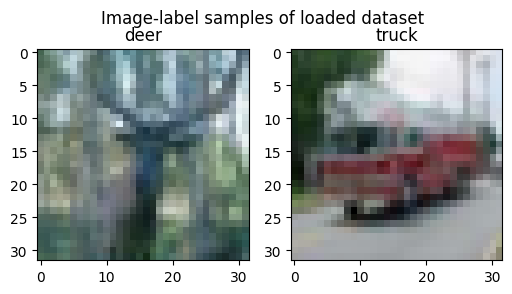

Created prompts: ['a photo of a airplane', 'a photo of a automobile', 'a photo of a bird', 'a photo of a cat', 'a photo of a deer', 'a photo of a dog', 'a photo of a frog', 'a photo of a horse', 'a photo of a ship', 'a photo of a truck']


In [50]:
image_embeddings, text_embeddings, labels, label_names, text_prompts = load_embeddings_for_dataset("cifar10")

In [51]:
plot_embeddings(image_embeddings, text_embeddings, labels, label_names, text_prompts)

<font color="blue"><b>Comment:</b></font> Looking at the plot, we can see that CLIP was able to create similar embeddings for the text prompts and their corresponding images. All text prompts are in the vicinity of their images. Furthermore we can see that different clusters appeared representing similar objects. For example automobile and truck photos and text prompts are right next to each other. Similarly all animals are grouped in a cluster on the right side. <br>
One text prompt that was not embedded just like its images was "cat" here the text prompt embedding is a little bit farther away from the images. But here we can also see that the cat images have a wider spread than most other image groups, so it is possible that the images were hard to differentiate from the "frog" and "dog" class, where the cat images are spread between. We assume, that to better differentiate between these 3 animals, higher resolution images are necessary as the visual difference especially between cat and dog can be quite small. 

### Task 2: MNIST dataset
The evaluation of the MNIST dataset. Can you draw some conclusions about CLIP and the dataset?

Found cached dataset mnist (/home/stud/p/ps164/.cache/huggingface/datasets/mnist/mnist/1.0.0/9d494b7f466d6931c64fb39d58bb1249a4d85c9eb9865d9bc20960b999e2a332)


  0%|          | 0/2 [00:00<?, ?it/s]

Loaded dataset mnist with 1280 train entries
Unique labels: ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']


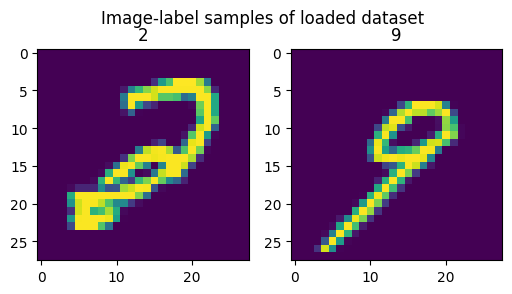

Created prompts: ['a photo of a 0', 'a photo of a 1', 'a photo of a 2', 'a photo of a 3', 'a photo of a 4', 'a photo of a 5', 'a photo of a 6', 'a photo of a 7', 'a photo of a 8', 'a photo of a 9']


In [52]:
image_embeddings, text_embeddings, labels, label_names, text_prompts = load_embeddings_for_dataset("mnist", force_3channel=False)

In [53]:
plot_embeddings(image_embeddings, text_embeddings, labels, label_names, text_prompts)

<font color="blue"><b>Comment:</b></font> Using the same text prompt style as with the cifar dataset, the mnist number dataset was not represented as well with the clip model. While we can see, that the model can differentiate between different numbers in images by looking at the relatively homogenous clusters that formed, the text prompts were not mapped correcly to the corresponding images. To test if this poor performance was the result of our specific prompt, we decided to test a couple of different prompts with the mnist number dataset. The results can be seen below.

##### Testing with written out numbers

In [54]:
os.remove("./embeddings_data/mnist_embeddings.npy") # Removing saved embeddings for mnist

prompt = [f"a photo of a {label_name}" for label_name in ["zero", "one", "two", "three", "four", "five", "six", "seven", "eight", "nine"]]
image_embeddings, text_embeddings, labels, label_names, text_prompts = load_embeddings_for_dataset("mnist", force_3channel=False, show_imgs=False, custom_text_prompts=prompt)

Found cached dataset mnist (/home/stud/p/ps164/.cache/huggingface/datasets/mnist/mnist/1.0.0/9d494b7f466d6931c64fb39d58bb1249a4d85c9eb9865d9bc20960b999e2a332)


  0%|          | 0/2 [00:00<?, ?it/s]

Loaded dataset mnist with 1280 train entries
Unique labels: ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']
Created prompts: ['a photo of a zero', 'a photo of a one', 'a photo of a two', 'a photo of a three', 'a photo of a four', 'a photo of a five', 'a photo of a six', 'a photo of a seven', 'a photo of a eight', 'a photo of a nine']


In [55]:
plot_embeddings(image_embeddings, text_embeddings, labels, label_names, text_prompts)

##### Testing with prompt that specifies its a number

In [56]:
os.remove("./embeddings_data/mnist_embeddings.npy") # Removing saved embeddings for mnist

prompt = [f"the number {label_name}" for label_name in ["zero", "one", "two", "three", "four", "five", "six", "seven", "eight", "nine"]]
image_embeddings, text_embeddings, labels, label_names, text_prompts = load_embeddings_for_dataset("mnist", force_3channel=True, show_imgs=False, custom_text_prompts=prompt)

Found cached dataset mnist (/home/stud/p/ps164/.cache/huggingface/datasets/mnist/mnist/1.0.0/9d494b7f466d6931c64fb39d58bb1249a4d85c9eb9865d9bc20960b999e2a332)


  0%|          | 0/2 [00:00<?, ?it/s]

Loaded dataset mnist with 1280 train entries
Unique labels: ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']
Created prompts: ['the number zero', 'the number one', 'the number two', 'the number three', 'the number four', 'the number five', 'the number six', 'the number seven', 'the number eight', 'the number nine']


In [57]:
plot_embeddings(image_embeddings, text_embeddings, labels, label_names, text_prompts)

<font color="blue"><b>Comment:</b></font> To further analyze the bad performance of CLIP with the mnist dataset, we tried different text prompts with spelled out numbers or with a different sentence which especially mentiones that there is just a number in the image. <br>
The results however did not improve as can be seen in the plots above. The model still couldn't embedd the text prompts the same way as their corresponding images. Because of this we think that the CLIP model did not recieve many training images where the description explicitly mentiones the number shown. We believe that the model focused mostly on the subject of the text prompt ("photo" or "number") and because of that the text prompts are all embedded similarly and are groupted in the bottom right of the plots.

### Task 3: Custom Dataset

After analyzing the CIFAR10 and MNIST dataset, perform the same evaluation on a dataset of your choice. 

Found cached dataset fashion_mnist (/home/stud/p/ps164/.cache/huggingface/datasets/fashion_mnist/fashion_mnist/1.0.0/0a671f063342996f19779d38c0ab4abef9c64f757b35af8134b331c294d7ba48)


  0%|          | 0/2 [00:00<?, ?it/s]

Loaded dataset fashion_mnist with 1280 train entries
Unique labels: ['T - shirt / top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']


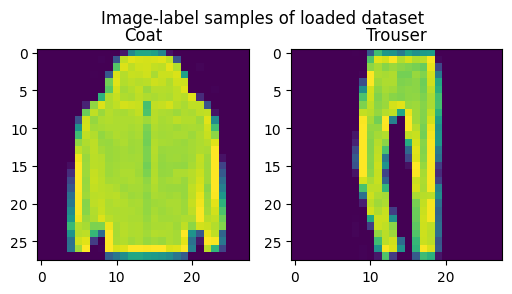

Created prompts: ['a photo of a T - shirt / top', 'a photo of a Trouser', 'a photo of a Pullover', 'a photo of a Dress', 'a photo of a Coat', 'a photo of a Sandal', 'a photo of a Shirt', 'a photo of a Sneaker', 'a photo of a Bag', 'a photo of a Ankle boot']


In [58]:
image_embeddings, text_embeddings, labels, label_names, text_prompts = load_embeddings_for_dataset("fashion_mnist")

In [59]:
plot_embeddings(image_embeddings, text_embeddings, labels, label_names, text_prompts, dont_sort=True)

<font color="blue"><b>Comment:</b></font> For our custom dataset we decided to use the mnist fashion dataset. The embeddings of the CLIP model look better than in the mnist number dataset, but not as accurate as with cifar10. The text prompt embeddings are mostly in the vicinity of its corresponding images. We can see, that 2 clusters formed. One for shoe types and one for different clothing items. The "bag" class is separated further out. This result shows that CLIP can categorize different types of clothing. In the left cluster however, we can see, that CLIP could not separate "pullover", "coat" and "shirt" from each other. We assume, that this is in part because of the low image resolution 
<font color="blue"><h3>Conclusion</h3></font>
In conclusion, we can say that CLIP works best on real life images and performs well on connecting text prompts with the intended image class. However CLIP stuggles more with the mnist datasets, as they represent objects or numbers as drawings, which we assume CLIP was not trained on that much. 

# Part 5: Text and Image Retrieval System

In this section, we will use CLIP to match images to news articles. Therefore, we need to create text embeddigs for the whole dataset. As we are working with German news articles, we have to use the multilingual version of CLIP with the model name `clip-ViT-B-32-multilingual-v1` for encoding the text. For the images, we still use the same model as before `clip-ViT-B-32`. For this notebook, it is not necessary to understand the details of how the CLIP text encoder was adapted to more languages, but if this topic is of interest, you can read the paper here: [Making Monolingual Sentence Embeddings Multilingual using Knowledge Distillation](https://arxiv.org/abs/2004.09813)

As an side experiment, we will also try to use CLIP for text-to-text retrieval and check if it is possible to use CLIP for zero-shot text classification.

### Task 1: Create embeddings for all news articels with the CLIP text encoder

The maximum sequence length of the CLIP text encoder is unfortunately not very long, but we can simply truncate the news article to the first 170 characters so that the text encoder can create embeddings for all articles.

In [68]:
from PIL import Image
from sklearn.metrics.pairwise import cosine_similarity

In [60]:
# Here we load the multilingual CLIP model. Note, this model can only encode text.
# If you need embeddings for images, you must load the 'clip-ViT-B-32' model
text_encoder = SentenceTransformer('clip-ViT-B-32-multilingual-v1')
image_encoder = SentenceTransformer('clip-ViT-B-32', device='cpu')

##### Creating text embeddings

In [61]:
# Truncate the articles to the first 170 characters
truncated_texts = [text[:170] for text in texts]

# Encode the truncated articles using the CLIP text encoder
text_embeddings = text_encoder.encode(truncated_texts)
print(f"Text embeddings shape: {text_embeddings.shape} {text_embeddings.__class__}")

Text embeddings shape: (3315, 512) <class 'numpy.ndarray'>


##### Creating image embeddings


In [64]:
image_dir = "./Unsplash_pics"
image_files = [os.path.join(image_dir, img) for img in os.listdir(image_dir) if img.endswith(('.jpg', '.png'))]
images = [Image.open(img).convert('RGB') for img in image_files]
print(f"Loaded {len(images)} images")

Loaded 20 images


In [65]:
image_embeddings = image_encoder.encode(images)
print(f"Image embeddings shape: {image_embeddings.shape} {image_embeddings.__class__}")

Image embeddings shape: (20, 512) <class 'numpy.ndarray'>


### Task 2: Match News Articles to Images

Define a function `show_news_for_img(img_path, topk=5)`, which takes an image path as input and an integer `topk` that defines how many of the best matching news articles should be displayed. For evaluation, you can select some example images (minimum 5) from [Unsplash](https://unsplash.com/) and analyze how good the best 5 news articles match to the image.

The function should always display the image and afterwards the topk news articles and the similarity of the news article and image.

For calculating which news article fits best to an image, use the [cosine similarity](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.pairwise.cosine_similarity.html) metric provided from Scikit-learn. 

In [66]:
def show_news_for_img(img_path, topk=5):
    # Load the input image
    input_img = Image.open(img_path)

    # Create an embedding for the input image
    with torch.no_grad():
        input_img_embedding = image_encoder.encode([input_img])[0]

    # Reshape the input_img_embedding
    input_img_embedding = input_img_embedding.reshape(1, -1)

    # Calculate the cosine similarity between the input image embedding and all text embeddings # 
    # By calling flatten() on the similarities array, convert it into a one-dimensional array with a shape of (n,). 
    # This simplifies the process of finding the top-k most similar news articles, so that we can directly use the argsort() function to get the indices of the top-k highest similarity scores.
    similarities = cosine_similarity(input_img_embedding, text_embeddings).flatten()

    # Get the indices of the top-k most similar news articles
    topk_indices = similarities.argsort()[-topk:][::-1]

    # Display the input image
    plt.imshow(input_img)
    plt.axis('off')
    plt.show()

    # Display the top-k matching news articles and their similarity scores
    print(f"Top {topk} matching news articles:")
    for i, idx in enumerate(topk_indices, start=1):
        print(f"{i}. Similarity: {similarities[idx]:.4f}\n{texts[idx]}\n{'-' * 20}")


#### Examples of image and text matches

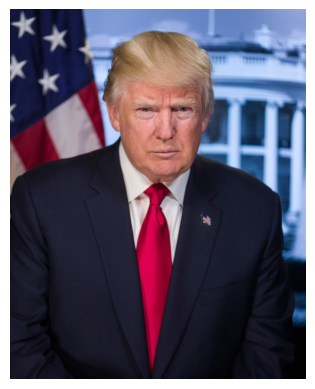

Top 5 matching news articles:
1. Similarity: 0.3088
26. Januar 2018: Diplomatie oder Krawall?
 Was für einen Auftritt wird US-Präsident Trump beim Weltwirtschaftsforum hinlegen? Außerdem im Podcast: Die miserable Lage der Drehbuchautoren könnte sich nun bessern.
--------------------
2. Similarity: 0.3037
USA: Präsident nominiert Kirstjen Nielsen als neue Heimatschutz-Chefin
Donald Trump will die Krisenexpertin Kirstjen Nielsen zur neuen Heimatschutzministerin machen. Im Weißen Haus gilt sie als Aufräumerin.
--------------------
3. Similarity: 0.2961
Trump schlägt Einbürgerung der „Dreamer“ vor
Der US-Präsident Donald Trump hat für die 1,8 Millionen illegalen Migranten eine langfristige Einbürgerung vorgeschlagen. Im Gegenzug fordert er Milliarden für den Bau der Grenze zu Mexiko.
--------------------
4. Similarity: 0.2949
Vereinigte Staaten: Trump legt Einwanderungsplan für 1,8 Millionen Migranten vor
Amerikanische Staatsbürgerschaft für die „Dreamers“ - gegen den Bau einer Grenzmauer 

In [69]:
show_news_for_img('./Unsplash_pics/trump.jpg', topk=5)

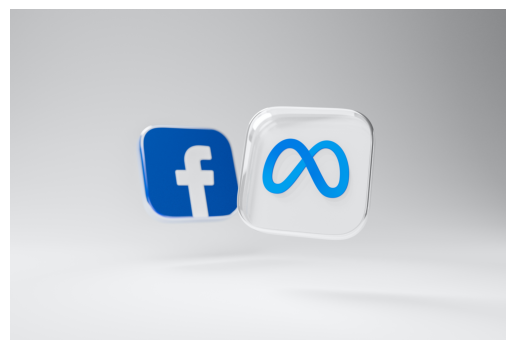

Top 5 matching news articles:
1. Similarity: 0.3027
Soziale Netzwerke: Maas rüstet personell gegen Facebook & Co. auf
Beim Bundesamt für Justiz sollen nach SPIEGEL-Informationen rund 50 Mitarbeiter die Umsetzung des Facebook-Gesetzes begleiten. Anfang Oktober soll bereits die Hälfte einsatzbereit sein.
--------------------
2. Similarity: 0.2982
Neue Algorithmen für Facebook: Weniger Nachrichten, mehr Persönliches
Statt "relevanter Inhalte" stehen bei Facebook fortan "bedeutsame Interaktionen" mit Menschen im Vordergrund. Das bedeutet mehr Katzen- und Babyfotos, weniger Nachrichten. User werden dann womöglich weniger Zeit auf Facebook verbringen.
--------------------
3. Similarity: 0.2958
Statt Docker und Kubernetes: Facebook braucht Tupperware für seine Container
Für seine eigenen Dienste verzichtet Facebook komplett auf Docker oder auch Kubernetes. Stattdessen nutzt das Unternehmen die Eigenentwicklung Tupperware für seine Container und setzt sonst auf Standard-Linux-Technik wie Syste

In [70]:
show_news_for_img('./Unsplash_pics/dima-solomin-yIT9HO8UrPA-unsplash.jpg', topk=5)

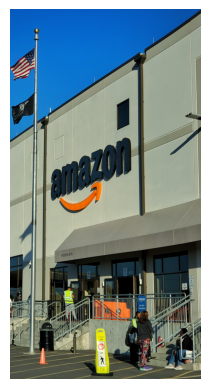

Top 5 matching news articles:
1. Similarity: 0.3352
Enormer Personalbedarf: Amazon sucht 13.000 Saisonarbeiter fürs Weihnachtsgeschäft
Amazon rüstet sich für das umsatzstarke Weihnachtsgeschäft: Der US-Handelsriese sucht in Deutschland 13.000 Saisonkräfte - was fast einer Verdopplung seiner Mitarbeiter entspricht.
--------------------
2. Similarity: 0.3231
Amazon: Hauseigene Produkte per Ratenzahlung kaufen
Sie interessieren sich für ein Amazon-Gerät, haben aber aktuell nicht genug Geld? Kein Problem – dank der neuen Amazon-Ratenzahlung.
--------------------
3. Similarity: 0.3179
Amazon: Alexa, wo sollen wir bauen?
 Der Onlinehändler plant den Bau eines zweiten Hauptsitzes in den USA. Mehr als 100 Städte hoffen auf Milliardeninvestitionen und neue Jobs. Zahlt sich die Rechnung aus?
--------------------
4. Similarity: 0.3144
Umstritten: Amazon senkt Preise seiner Händler
Ist ein Artikel zu teuer, kauft ihn keiner. Dagegen geht Amazon in den USA jetzt auch bei Händlern vor, die eigentlic

In [71]:
show_news_for_img('./Unsplash_pics/amazon.jpg', topk=5)

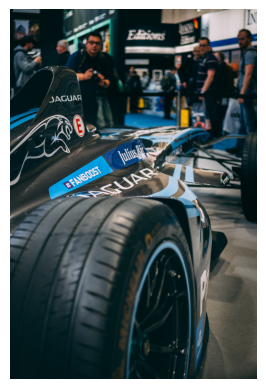

Top 5 matching news articles:
1. Similarity: 0.2744
Schnellstes Serienauto: Koenigsegg schlägt Bugatti
Kein Serienauto der Welt war bislang schneller: Der Agera RS von Koenigsegg erreichte mit seinen 1.176 PS nun eine neue Höchstgeschwindigkeit.
--------------------
2. Similarity: 0.2722
E-Auto-Batterien: Daimler-Ersatzteillager geht als Stromspeicher ans Netz
Eigentlich sind die Lithium-Ionen-Akkus von Daimler für Elektro-Smarts gedacht. Bis sie dort als Ersatzteil benötigt werden, kommen sie in Hannover als Stromspeicher zum Einsatz.
--------------------
3. Similarity: 0.2716
Live-Stream: So sehen Sie die Formel 1 live im Internet
Zum vorerst letzten Mal startet am Sonntag, 01. Oktober der Große Preis von Malaysia in Sepang. Wie Sie das Rennen im Internet verfolgen, steht hier.
--------------------
4. Similarity: 0.2697
TV-Hammer: Sky steigt bei Formel 1 aus!
Der Pay-TV-Sender Sky Deutschland verzichtet künftig auf die Formel 1 – und zeigt weniger Champions League. Die Infos!
-------

In [72]:
show_news_for_img('./Unsplash_pics/matt-seymour-3uu5_kn1k_Y-unsplash.jpg', topk=5)

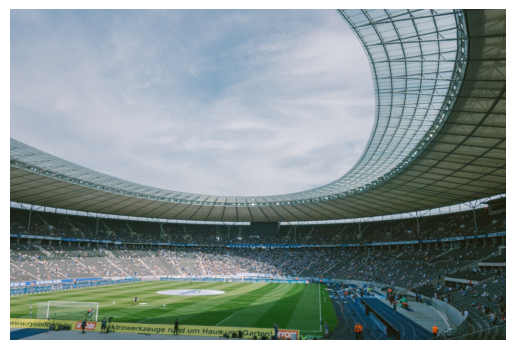

Top 5 matching news articles:
1. Similarity: 0.3030
Bundesliga im Liveticker: Schalke - Hannover
Nach den Patzern der Konkurrenz können die Königsblauen erster „Verfolger“ der Bayern werden. Mit Abgang Leon Goretzka in der Startelf geht es nun gegen Hannover. Verfolgen Sie das Spiel im Liveticker.
--------------------
2. Similarity: 0.3014
0:0 gegen Bremen – Krisen-Quälerei ohne Tor in Köln
Schlimmer geht‘s nimmer: Die Kellerkinder Köln und Bremen liefern sich zur besten Zweitligazeit ein Spiel auf niedrigem Niveau. Wenigstens ein FC-Spieler findet einen Trost in der Nullnummer.
--------------------
3. Similarity: 0.2998
Minusrekord
Die Welt ist ungerecht, sogar im Fußball. 12 500 Menschen waren am Sonntag im Grünwalder Stadion. Nicht nur sie verpassten Unterföhrings ersten Sieg.
--------------------
4. Similarity: 0.2978
Videobeweis: In vielen Sportarten längst etabliert
Seit dieser Saison wird der Videobeweis in der Fußball-Bundesliga eingesetzt – zunächst in einer Testphase. Vieles 

In [73]:
show_news_for_img('./Unsplash_pics/fionn-grosse-G5uasfXjZdc-unsplash.jpg', topk=5)

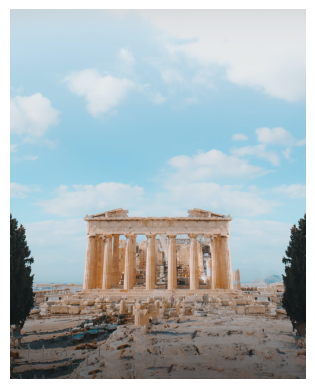

Top 5 matching news articles:
1. Similarity: 0.2938
Griechenland: Scharia-Rechtsprechung wird eingeschränkt
 In der griechischen Region Westthrakien ist das islamische Recht eingeschränkt gültig. Doch nun hat das Parlament die Rechte muslimischer Geistlicher weiter begrenzt.
--------------------
2. Similarity: 0.2750
Selbst Griechenland hängt Italien ab
Italiens Wirtschaft ist zuletzt zwar ein wenig gewachsen. Doch die grundlegenden Probleme bestehen nach wie vor. Und die Programme für die anstehenden Wahlen könnten die Krise noch verschärfen.
--------------------
3. Similarity: 0.2718
Griechenland: Fraport will Schadensersatz für marode Flughäfen
Lampen, Türen, Feuerlöscher: In den 14 Flughäfen, die Fraport der griechischen Regierung abgekauft hat, ist vieles kaputt. Die Deutschen fordern nun Entschädigung.
--------------------
4. Similarity: 0.2673
Brüssels Pläne für Griechenland sind eine große Illusion
Eine aktuelle Studie des Freiburger Thinktanks CEP warnt: Griechenland ist nach 

In [74]:
show_news_for_img('./Unsplash_pics/pat-whelen-cHvyUM-kXoA-unsplash.jpg', topk=5)

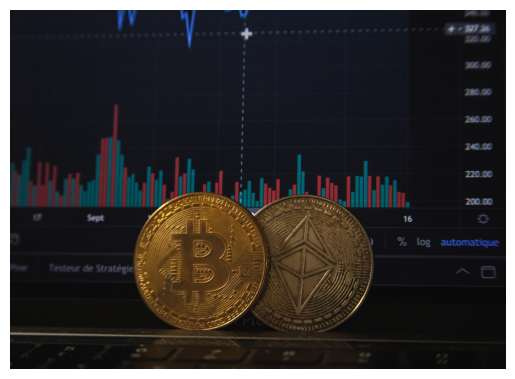

Top 5 matching news articles:
1. Similarity: 0.2943
Sorge vor Regulierung: Bitcoin fällt unter 10.000 Dollar
Die Kryptowährung Bitcoin steht weiter unter Druck. Auf großen Handelsplattformen fiel sie auf den niedrigsten Stand seit zwei Monaten.
--------------------
2. Similarity: 0.2941
Rekordhoch: Bitcoin-Kurs steigt auf mehr als 7000 Dollar
Die Kryptowährung Bitcoin rast von Rekordhoch zu Rekordhoch: Ihr Wert stieg erstmals über die Marke von 7000 Dollar. Allein in den vergangenen Wochen legte der Kurs um 70 Prozent zu.
--------------------
3. Similarity: 0.2921
Bitcoin erstmals bewertet: Ist der Hype gerechtfertigt?
Um Kryptowährungen wie Bitcoin und Ethereum gibt es einen großen Wirbel. Eine US-Ratingagentur hat die digitalen Zahlungsmittel erstmals bewertet.
--------------------
4. Similarity: 0.2918
Währung oder Spekulationsobjekt – das Bitcoin-Dilemma: Zahlen oder Zocken?
Als Währung gedacht, doch vor allem zum Spekulieren genutzt: Der Bitcoin-Höhenflug steht dem ursprünglichen 

In [75]:
show_news_for_img('./Unsplash_pics/pierre-borthiry-peiobty-vBCVcWUyvyM-unsplash.jpg', topk=5)

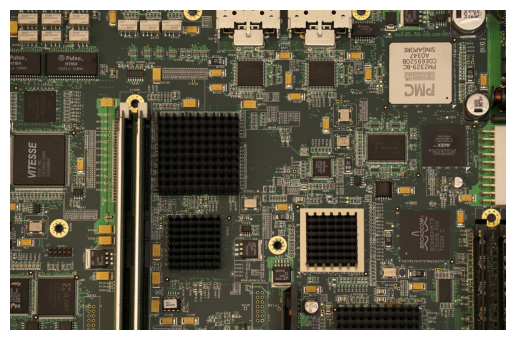

Top 5 matching news articles:
1. Similarity: 0.3085
Prozessor-Lücken Meltdown und Spectre: Intel und ARM führen betroffene Prozessoren auf, Nvidia analysiert noch
Betroffen sind unter anderem sämtliche Intel-Core-Prozessoren bis zurück zum Jahr 2008 sowie eine Vielzahl von ARM-Cortex-CPUs. Nvidia glaubt, dass die CUDA-GPUs nicht anfällig sind und analysiert noch seine Tegra-Prozessoren.
--------------------
2. Similarity: 0.3062
Hunderttausende Infineon-Sicherheits-Chips weisen RSA-Schwachstelle auf
Viele Hardware-Hersteller verbauen Trusted Platform Modules (TPMs) von Infineon. In denen befindet sich bereits seit 2012 eine Lücke, die die Sicherheit von RSA aushebelt. Einige Hersteller haben Sicherheitsupdates veröffentlicht; andere stehen noch aus.
--------------------
3. Similarity: 0.3040
CES: Intel Core i-8000G: Kombiprozessoren mit leistungsfähiger Vega-Grafik für Notebooks
Die leistungsfähigen Quad-Core-CPUs mit AMD-GPU und HBM2-Speicher ersetzen in flachen Notebooks Mobil-Grafik

In [76]:
show_news_for_img('./Unsplash_pics/bartosz-kwitkowski-SJ5TmRRSM1U-unsplash.jpg', topk=5)

<font color="blue"><h3>Elaboration</h3></font>

Interestingly the Images match very well to the found articles, even though the cosine similarity score is relatively low. Cosine similarity is a metric used to measure the similarity between two vectors, with values ranging from -1 (completely dissimilar) to 1 (completely identical). However, cosine similarity might not always perfectly capture the perceptual similarity between the images and the texts in the context of this specific problem.

When the cosine similarity is relatively low, but the results are still satisfying, it could mean a few things:

1. The embeddings might not be perfectly aligned: Although the embeddings generated by the model may capture some semantic information about the images and texts, they might not be perfectly aligned, causing the cosine similarity scores to be lower than expected. Nevertheless, the ranking of the news articles might still be meaningful.
2. The similarity is relative: In some cases, the absolute value of the cosine similarity might not be that high, but the relative ranking of the news articles could still be relevant. It's possible that the top 5 articles are indeed the best matches among all available articles, even though their similarity scores are not very high.

Low cosine similarity scores do not necessarily imply poor performance. The results can still be satisfactory if the ranking of the most relevant articles is meaningful and accurate. It's crucial to evaluate the results by examining the content of the matched articles and their relevance to the given image rather than relying solely on the cosine similarity scores.

What also can be a reasonable explainantion is that the text do actually fit the picture, but because two encoders (image_encoder and text_encoder) are learned and backpropagated because it is actually a loss.

### Task 3: CLIP for zero-shot text classification

In this experiment, analyze how good CLIP is for zero-shot text classification.
Use `class_prompts = ['Dies ist ein Technischer Text', 'Dies ist ein Genereller Text']` as the zero-shot class text prompts to assign the news articles to one of the two categories.

Then calculate the cosine similarity between the news articles and the text and check which class has the higher similarity. Calculate the accuracy of the zero-shot text classifier. How do you interpret the results?


In [77]:
# Create embeddings for the class prompts
class_prompts = ['Dies ist ein Technischer Text', 'Dies ist ein Genereller Text']
class_prompt_embeddings = text_encoder.encode(class_prompts)
print(f"Embeddings shape: {class_prompt_embeddings.shape} {class_prompt_embeddings.__class__}")

Embeddings shape: (2, 512) <class 'numpy.ndarray'>


In [78]:
# Encode the texts
text_embeddings = text_encoder.encode(texts)
print(f"Embeddings shape: {text_embeddings.shape} {text_embeddings.__class__}")

Embeddings shape: (3315, 512) <class 'numpy.ndarray'>


In [79]:
# Calculate the cosine similarity between the text embeddings and class prompt embeddings
from sklearn.metrics.pairwise import cosine_similarity

cosine_similarity_matrix = cosine_similarity(text_embeddings, class_prompt_embeddings)
print(cosine_similarity_matrix)

[[0.8557244  0.8595626 ]
 [0.7768815  0.7784012 ]
 [0.87496996 0.8787178 ]
 ...
 [0.78353333 0.79085326]
 [0.8175785  0.8120601 ]
 [0.8737849  0.8776094 ]]


In [80]:
# Extract the predicted labels
predicted_labels = np.argmax(cosine_similarity_matrix, axis=1)
print(predicted_labels[:20])

[1 1 1 0 0 0 0 0 0 1 1 1 1 0 0 1 0 1 0 1]


In [84]:
# Print the real labels, predicted labels, the text, and the similarity scores
random_indexes = random.choices(range(len(texts)), k=8)

for i in random_indexes:
    real_label = labels[i]
    predicted_label = predicted_labels[i]
    text = texts[i]
    cosine_similarity_scores = cosine_similarity_matrix[i]

    print(f"Real label: {real_label}, Predicted label: {predicted_label}")
    print(f"Similarity scores: Tech = {cosine_similarity_scores[0]:.4f}, General = {cosine_similarity_scores[1]:.4f}")
    print(f"Text: {text}\n{'-' * 20}\n")


Real label: 1, Predicted label: 0
Similarity scores: Tech = 0.7931, General = 0.7848
Text: Beim Sony AF8 ist der Bildschirm der Lautsprecher
Wo kommt denn die Musik her? Der neue Sony Bravia AF8 scheint ohne Lautsprecher auszukommen. Der Clou: Der Bildschirm selbst funktioniert auch als Membran. Möglich macht es die OLED-Bildschirmtechnik.
--------------------

Real label: 1, Predicted label: 1
Similarity scores: Tech = 0.8270, General = 0.8365
Text: De Maizières Poker in der Flüchtlingsfrage
Der Innenminister will mit einem Trick die Verhärtung in der europäischen Asylpolitik aufweichen. Die umstrittene Verteilung von Flüchtlingen in der EU nach Quoten soll zurückgestellt werden, um andere Fragen rascher lösen zu können
--------------------

Real label: 1, Predicted label: 1
Similarity scores: Tech = 0.8845, General = 0.8897
Text: Die schrägsten Chefs der Welt
Wer ausgefallene Führungsstile sucht, muss in Start-ups und im Mittelstand gucken: Mancher Chef lässt die Mitarbeiter im Bälle

<font color="blue"><b>Comment:</b></font> At first glance, the model seems to correctly identify general texts, while technical texts get missclassified. Some examples can be seen in the output above. <br>
To further analyze this observation we calculated the accuracy for the whole dataset and for both classes separately

In [85]:
# Calculate the accuracy of the zero-shot text classifier for whole dataset
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(labels, predicted_labels)
print(f"Zero-shot text classification accuracy: {accuracy * 100:.2f}%")

Zero-shot text classification accuracy: 82.59%


In [86]:
# Calculate the accuracy of the zero-shot text classifier for labels separately
tech_predictions = []
gen_predictions = []

for i in range(len(texts)):
    if labels[i] == 0:
        tech_predictions.append(predicted_labels[i])
    else:
        gen_predictions.append(predicted_labels[i])

tech_accuracy = accuracy_score([0]*len(tech_predictions), tech_predictions)
gen_accuracy = accuracy_score([1]*len(gen_predictions), gen_predictions)

print(f"Zero-shot technical text classification accuracy: {tech_accuracy * 100:.2f}%")
print(f"Zero-shot general text classification accuracy: {gen_accuracy * 100:.2f}%")

Zero-shot technical text classification accuracy: 54.92%
Zero-shot general text classification accuracy: 93.96%


<font color="blue"><b>Comment:</b></font> An first glance, an accuracy of ~82% indicates that the zero-shot text classifier using the CLIP model is able to correctly classify about 82% of the news articles into their respective categories ('Technischer Text' and 'Genereller Text'). However looking at the predictions in more detail, we can see, that the model is biased towards classifying a text as "general". The accuracy for technical texts was about 50%, which with binary classification means the model is basically guessing. On the other hand the model had an accuracy of over 90% with general text. <br>
We assume that this behavior could be, because the embedding of the word "generell" is much closer to most normal words than "technisch". Because of this, it cloud be that many technical texts are also classified as general. With some fine tuning however, we think that the model clould become very good at this classification, as we can already see, that some technical texts are classified correctly indicating that the model sees a slight connection between the word "technisch" and some words in the technical news articles.

### Task 4: CLIP for text-to-text retrieval

Define a function `show_news_for_keywords(keywords, topk=5)`, which takes a string as input and an integer topk that defines how many of the best matching news articles should be displayed. For evaluation, try out some different keywords such as `Sport Fußball` or `Donald Trump` and interpret the best matching news articles. What final conclusions can you draw about the CLIP model? Why do you think CLIP shows this kind of behavior? 

The function should always display the keywords and then the top news articles, as well as the similarity of the news article to the keywords.

In [87]:
def show_news_for_keywords(keywords, topk=5):
    # Encode the input keywords
    keyword_embedding = text_encoder.encode([keywords])[0]

    # Reshape the keyword_embedding
    keyword_embedding = keyword_embedding.reshape(1, -1)

    # Calculate the cosine similarity between the keyword embedding and text embeddings
    similarities = cosine_similarity(keyword_embedding, text_embeddings).flatten()

    # Get the indices of the top-k most similar news articles
    topk_indices = similarities.argsort()[-topk:][::-1]

    # Display the input keywords
    print(f"Keywords: {keywords}\n")

    # Display the top-k matching news articles and their similarity scores
    print(f"Top {topk} matching news articles:")
    for i, idx in enumerate(topk_indices, start=1):
        print(f"{i}. Similarity: {similarities[idx]:.4f}\n{texts[idx]}\n{'-' * 20}")
        print("")

In [88]:
show_news_for_keywords("Sport Fußball", topk=5)
print("="*40)
show_news_for_keywords("Donald Trump", topk=5)
print("="*40)
show_news_for_keywords("Amazon", topk=5)
print("="*40)
show_news_for_keywords("Regierung", topk=5)

Keywords: Sport Fußball

Top 5 matching news articles:
1. Similarity: 0.9149
Videobeweis: Im Darkroom des Fußballs
 Der Videobeweis sollte den Fußball gerechter machen. Das klappte nur selten. Mit der Entmachtung Hellmut Krugs zeigt sich sogar ein ganz anderer Verdacht.
--------------------

2. Similarity: 0.9004
Freuen, bitte
Der FCA schlägt nach dem 0:1 schnell zurück, wütet gegen den Video-Schiedsrichter - und beweist, ein unangenehmer Gegner zu sein.
--------------------

3. Similarity: 0.8994
Der Traum vom Gymnasium
Die Gemeinde bringt sich vorsichtig als Standort ins Spiel.
--------------------

4. Similarity: 0.8980
Videobeweis: In vielen Sportarten längst etabliert
Seit dieser Saison wird der Videobeweis in der Fußball-Bundesliga eingesetzt – zunächst in einer Testphase. Vieles läuft nicht reibungslos. Andere Sportarten sind schon viel weiter.
--------------------

5. Similarity: 0.8897
„Tester bei der USK zu sein ist der absolute Traumjob“
Die USK prüft, ab welchem Alter ein V

<font color="blue"><h3>Elaboration</h3></font>
The high similarities and fitting article examples above indicate that text-to-text retrieval with CLIP works pretty well. The model can effectively find content in the dataset, related to the given keyword.

### Bonus: Image-to-image retrieval with CLIP

As an bonus experiment you can test, how good CLIP is for image-to-image retrieval. This should be straightforward to implement, since you already know, how to use clip for image-to-text and text-to-text retrieval. 

What hypothesis do you have regarding the performance of CLIP's image-to-image capabilities? <br>
<font color="blue"><b>Comment:</b></font> We think that because of CLIPs good performance between image and text, it will also perform well in this task, as similar images should have similar embeddings. This could be due to the separated Image Encoder and Text Encoder. They both have learned for their specific data type even better, that the connections between them.

In [89]:
def show_similar_images(img_path, topk=5):
    # Load the input image
    input_img = Image.open(img_path).convert('RGB')

    # Create an embedding for the input image
    with torch.no_grad():
        input_img_embedding = image_encoder.encode([input_img])[0]

    # Reshape the input_img_embedding
    input_img_embedding = input_img_embedding.reshape(1, -1)

    # Calculate the cosine similarity between the input image embedding and all image embeddings
    similarities = cosine_similarity(input_img_embedding, image_embeddings).flatten()

    # Get the indices of the top-k most similar images
    topk_indices = similarities.argsort()[-topk:][::-1]

    # Display the input image
    plt.imshow(input_img)
    plt.axis('off')
    plt.title("Input Image")
    plt.show()

    # Create a figure and a grid of axes
    fig, axs = plt.subplots(2, 3, figsize=(10, 5))
    # Loop over the axes and plot each image
    for i, ax in enumerate(axs.flat):
        idx = topk_indices[i]
        img = Image.open(image_files[idx]).convert('RGB')
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"Similarity {similarities[idx]:.4f}")
    plt.suptitle(f"Top {topk} similar images:")
    plt.show()

##### Testing different images

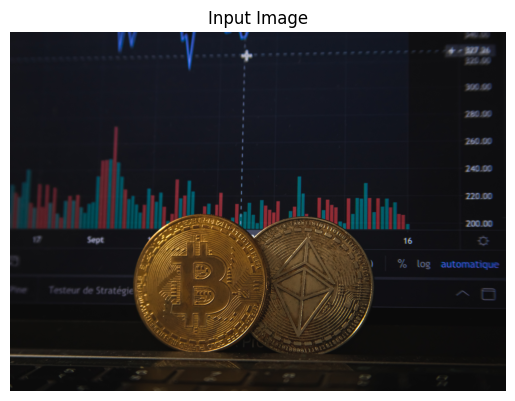

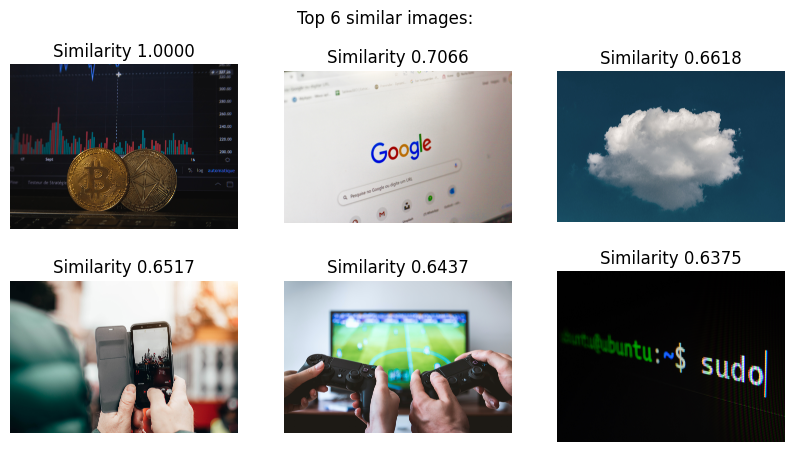

In [90]:
# Test the function with an example image
show_similar_images('./Unsplash_pics/pierre-borthiry-peiobty-vBCVcWUyvyM-unsplash.jpg', topk=6)

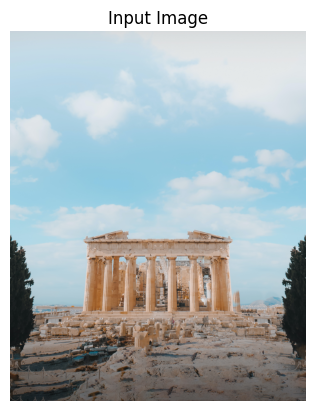

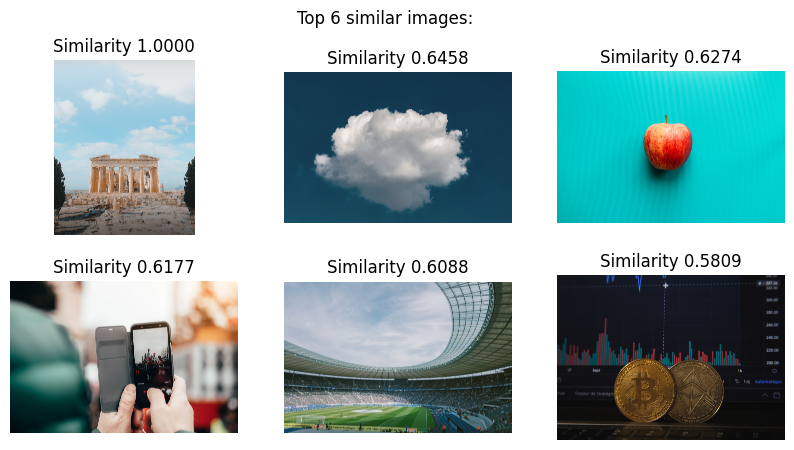

In [91]:
show_similar_images('./Unsplash_pics/pat-whelen-cHvyUM-kXoA-unsplash.jpg' , topk=6)

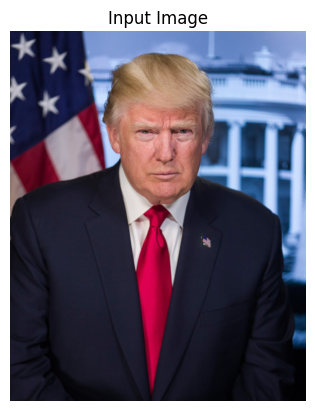

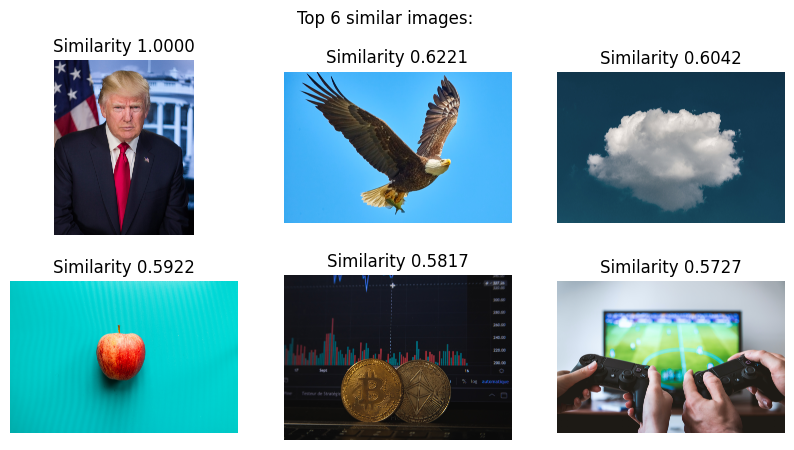

In [92]:
show_similar_images('./Unsplash_pics/trump.jpg' , topk=6)

<font color="blue"><h3>Elaboration:</h3></font>

CLIP models primarily serve to enable image-to-text and text-to-image search tasks. Nonetheless, their extensive training on vast quantities of image-text pairs suggests they may also be adept at image-to-image retrieval. By learning meaningful characteristics for both images and text, CLIP models generate embeddings that can be employed for efficient comparison and retrieval of similar images.

Some interesting connections it made was with Donald Trumt and an Eagle, as well as Bitcoin and Goole. While these image pairs look nothing alike, the model never the less recogniced their strong connection.

While it's essential to recognize that models explicitly created for image-to-image retrieval could potentially surpass CLIP in this area, the model's design and training on image-text pairs indicate it should still provide adequate performance for such tasks.

# Part 6: Semantic Search with only text-based model

In the final experiment, we will use the [Multilingual Universal Sentence Encoder for Semantic Retrieval](https://ai.googleblog.com/2019/07/multilingual-universal-sentence-encoder.html) model for text-to-text retrieval. 
The model name is `distiluse-base-multilingual-cased-v1`.

CLIP uses one image and one text encoder to link text and images. In contrast this model uses a shared text encoder as it only computes embeddings for text passages. Instead of image-text pairs, we have text-text pairs, where one text is a paragraph (similar to the image) and the other text is similar to the caption. The model is trained in a multi-task setting. The following picture shows the training objectives for each task. All tasks receive two text segments as input and in addition, the question answering and translation tasks have almost the same objective as CLIP, which is to match one text block to another text block. 

<img src="Pics/use-model.png" width=500 />
(img src: https://ai.googleblog.com/2019/07/multilingual-universal-sentence-encoder.html)

Recalculate the text embeddings for all news articles with the new model. Then perform the same experiments as in part 5 task 3 and task 4. It should be possible to use the same method `show_news_for_keywords(keywords, topk=5)` as in the previous experiment.

Interpret the accuracy of the zero-shot text classification experiment compared to the experiment before? 
How good is the news article retrieval system for the same keywords as in part 5 task 4?

In [93]:
model_use = SentenceTransformer('distiluse-base-multilingual-cased-v1')

In [94]:
# Compute the text embeddings for all news articles
text_embeddings_use = model_use.encode(texts)
print(f"Embeddings shape: {text_embeddings_use.shape} {text_embeddings_use.__class__}")

Embeddings shape: (3315, 512) <class 'numpy.ndarray'>


In [95]:
def show_news_for_keywords_use(keywords, topk=5):
    # Encode the keywords using the USE model
    keywords_embedding = model_use.encode([keywords])[0].reshape(1, -1)

    # Calculate the cosine similarity between the keywords embedding and all text embeddings
    similarities = cosine_similarity(keywords_embedding, text_embeddings_use).flatten()

    # Get the indices of the top-k most similar news articles
    topk_indices = similarities.argsort()[-topk:][::-1]

    # Display the keywords
    print(f"Keywords: {keywords}\n")

    # Display the top-k matching news articles and their similarity scores
    print(f"Top {topk} matching news articles:")
    for i, idx in enumerate(topk_indices, start=1):
        print(f"{i}. Similarity: {similarities[idx]:.4f}\n{texts[idx]}\n{'-' * 20}")


In [96]:
show_news_for_keywords_use('Sport Fußball', topk=5)
print("="*40)
show_news_for_keywords_use('Donald Trump', topk=5)
print("="*40)
show_news_for_keywords_use('Amazon', topk=5)
print("="*40)
show_news_for_keywords_use('Regierung', topk=5)

Keywords: Sport Fußball

Top 5 matching news articles:
1. Similarity: 0.4156
Videobeweis: In vielen Sportarten längst etabliert
Seit dieser Saison wird der Videobeweis in der Fußball-Bundesliga eingesetzt – zunächst in einer Testphase. Vieles läuft nicht reibungslos. Andere Sportarten sind schon viel weiter.
--------------------
2. Similarity: 0.3074
Missbrauch im Sport: Das Recht auf eine Grenze
Nach jahrzehntelangem Schweigen melden sich immer mehr Athleten zu Wort, die im Sport Opfer sexuellen Missbrauchs wurden. Die Sportverbände reagieren mit beachtlichen Präventionsmaßnahmen – aber reicht das?
--------------------
3. Similarity: 0.2941
Fußball-Bundesliga: Frankfurt gegen Bremen live sehen!
Im heutigen Bundesliga-Freitagsspiel treffen Frankfurt und Bremen aufeinander. COMPUTER BILD erklärt, wie und wo die Partie live übertragen wird.
--------------------
4. Similarity: 0.2862
"Nach Rio habe ich überlegt aufzuhören"
Deutsche Spitzensportler müssen teils mit wenigen Hundert Euro im 

<font color="blue"><h3>Elaboration</h3></font>
These are interestingly low although the first 5 articles seem to make sense or at least have a context on the first sight to the keyword. The vast difference of the cosine similarities between `clip-ViT-B-32-multilingual-v1 (CLIP)` and `distiluse-base-multilingual-cased-v1 (USE)` is attributed to the way these models have been trained. The distiluse-base-multilingual-cased-v1 model is a text-only model derived from the Universal Sentence Encoder (USE) family, specifically designed for semantic similarity tasks. It is trained on a variety of text-text pairs and learns to generate meaningful embeddings for text passages. However, its training data may not be as diverse or well-aligned with the specific domain of our news articles, leading to lower cosine similarity scores.

On the other hand, CLIP model is trained on a large dataset of image-text pairs, which helps it learn meaningful features for both images and text. CLIP learns the relationships between visual and textual information, allowing it to generate embeddings that capture a shared semantic space between images and text. As a result, it may be more capable of capturing the semantic similarity between keywords and news articles, leading to higher cosine similarity scores.

<font color="blue"><h2>Final Conclusion</h2></font>
The creation and training of different Word Embeddings showed the richness and variety of language models. From classical text-to-text to more interesting image-to-text tests, different sides of what is possible in the language context were highlighted. 

As libraries (such as HuggingFace and SentenceTransformer) were used, high-level functions and pretrained models were already contained. This was useful on one hand to easily apply them, get results fast and in a nice representation (e.g. UMAP usage before plotting). 
On the other hand, this led to some misunderstandings because the logic was ‘abstracted away’. We felt like we would have benefited from this exercise even more, when looking at the functions low-level and maybe implementing them by ourselves. 

Having a large amount of data in the vocabulary, it was examined that most Word Embeddings were created correctly. Simple tasks like looking at the similarity of words was quite easily implemented. Using different models such as word2vec and BERT showed how results can change when looking at different contexts of a word. Using CLIP for zero-shot-classification (word in vector space) wasn't as successful. CLIP for an image-to-text flow was more successful.

Many models are very specifically designed for one use case. The key to success therefore is to identify the needs of a task, understanding the kind of dataset used, understanding the needs of this data and choosing the correct library. This led to different lessons learned of what different kinds of word-embeddings have as benefits.